# Remember to check for most recent notes in "Notes.txt" as well as throughout the code.

In [25]:
from astropy.io import fits
from scipy.special import jv
import numpy as np
import matplotlib.pyplot as plt
from numpy import random
import copy as cp
import scipy
import hera_cal
from hera_cal.redcal import get_pos_reds
# from hera_sim import antpos
from tqdm import tqdm_notebook as tqdm

%matplotlib notebook


In [26]:
# importing data
hdul = fits.open("GLEAM_EGC_v2.fits")
flux_vals = hdul[1].data["int_flux_151"][np.argwhere(hdul[1].data["int_flux_151"]>25).reshape(-1)]
RAs = hdul[1].data["RAJ2000"][np.argwhere(hdul[1].data["int_flux_151"]>25).reshape(-1)]
DECs = hdul[1].data["DEJ2000"][np.argwhere(hdul[1].data["int_flux_151"]>25).reshape(-1)]
alphas = hdul[1].data["alpha"][np.argwhere(hdul[1].data["int_flux_151"]>25).reshape(-1)]

# test values to work with
test_bl = np.array([10,30,0])
reffreqs = 151*np.ones_like(flux_vals)
LSTs = np.linspace(0,360,10)
test_freqs = np.linspace(100e6,200e6,200)


/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in greater
  This is separate from the ipykernel package so we can avoid doing imports until
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in greater
  after removing the cwd from sys.path.
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in greater
  """
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in greater
  


In [27]:
def generate_beam(alt,az,freq,variation = False):
    
    x = np.expand_dims((np.cos(alt)*np.cos(az)), axis=-1)
    y = np.expand_dims((np.cos(alt)*np.sin(az)), axis=-1)
    
    k = 2*np.pi*freq/(3*10**8)
    
    random_val = 0
    if variation == True:
        random_val = np.random.randn()
    xpc = random_val
    ypc = random_val
    ax = 6 + random_val 
    ay = 6 + random_val 
    
    top = 2*jv(1,k*np.sqrt((ax**2)*((x-xpc)**2) + (ay**2)*(y-ypc)**2))
    bot = k*np.sqrt((ax**2)*((x-xpc)**2) + (ay**2)*(y-ypc)**2)
    beam = (top/bot)**2
    beam *= (np.expand_dims(alt, axis = -1)> 0)
    
    return beam

In [28]:
def generate_antpos(length, N,pert_size):
    '''Generates dictionary of antenna positions in a NxN grid as well as a copy of those positions
    with slight perturbations. Returns tuple in the form of unperturbed positions, perturbed positions.
    
    Args:
    length: physical length of one whole side (meters)
    N: number of antennae per row and per column
    pert_size: size of the Gaussian perturbation of the antannae positions away from their ideal
    spots.'''
    antpos = {}
    index = 0
    for i in np.arange(0,length,N):
        for j in np.arange(0,length,N):
            index += 1
            antpos[index] = np.array([i,j])

    np.random.seed(1)
    antposP = cp.deepcopy(antpos)
    for index in antposP.keys():
        antposP[index] += np.random.randn(2)*pert_size
    
    # Added this line to make sure the redundant baselines stay the same.
    if get_pos_reds(antpos) != get_pos_reds(antposP):
        raise Exception("Perturbation too large; antpos' do not share same redundancies.")
    
    return antpos,antposP

In [29]:
def get_source_spectra(flux_vals, reffreqs, freqs, alphas):
    '''dim output = [N_sources, N_frequencies]
    dim flux_vals = N_sources
    dim reffreqs = N_sources
    dim alphas = N_sources
    dim freqs = N_frequencies'''
    flux = flux_vals[:,np.newaxis]*(freqs[np.newaxis,:]/reffreqs[:,np.newaxis])**alphas[:,np.newaxis]
    return flux

In [30]:
def get_noisy_spectra(amplitudes,freqs):
    '''dim output = [N_sources, N_frequencies]
    Produce white noise spectra 
    dim amplitudes = N_sources
    dim freqs = N_frequencies'''
    return np.random.randn(len(amplitudes),len(freqs)) * np.ones_like(amplitudes[:,np.newaxis])



In [31]:
####### NOTE: Add dimension of alt and az in the docstring
def get_alt_az(LSTs,RA,DEC):
    '''Get (altitude, azimuth) given time and angles. Use these to find position vectors and/or
    generate beams (certain kinds). "lat" value is constant given in the paper and indicates 
    where the satellites actually are.'''
    lat = -30.722 # observer's latitude, given in the paper
    
    h = np.deg2rad(LSTs[:,np.newaxis] - RA[np.newaxis,:]) # dim: times, sources
    d = np.deg2rad(DEC) 
    L = np.deg2rad(lat)
    
    az = np.arctan2(np.sin(h)*np.cos(d), (np.cos(h)*np.cos(d)*np.sin(L) - np.sin(d)*np.cos(L))) + np.pi
    alt = np.arcsin(np.sin(L)*np.sin(d) + np.cos(L)*np.cos(d)*np.cos(h))
    
    return alt, az

In [32]:
alt, az = get_alt_az(LSTs,RAs,DECs)

In [33]:
def mod_vis(baseline,freqs,alt,az,source_spectra):
    # dimensions: positions, times, sources, freqs
    c = 3*10**8
    k = 2*np.pi*freqs/c
    
    x = (np.cos(alt)*np.cos(az))
    y = (np.cos(alt)*np.sin(az))
    z = np.sin(alt)
    r = np.array([x,y,z])
    
    airy_beam = generate_beam(alt,az,freqs)
    
    bdotr = np.einsum('i,ijk',baseline,r)[:,:,np.newaxis]
    exponential = np.exp(-2.0j*np.pi*(freqs[np.newaxis,np.newaxis,:]/(3*10**8))*bdotr)
    vis = source_spectra[np.newaxis,:] * airy_beam * exponential

    return np.sum(vis,axis = 1)

In [34]:
source_spectra = get_source_spectra(flux_vals, reffreqs, test_freqs, alphas)
Vtotal_test = mod_vis(test_bl,test_freqs,alt,az,source_spectra)

noisy_source_spectra = get_noisy_spectra(flux_vals, test_freqs)
noisy_Vtotal_test = mod_vis(test_bl,test_freqs,alt,az,noisy_source_spectra)

<IPython.core.display.Javascript object>


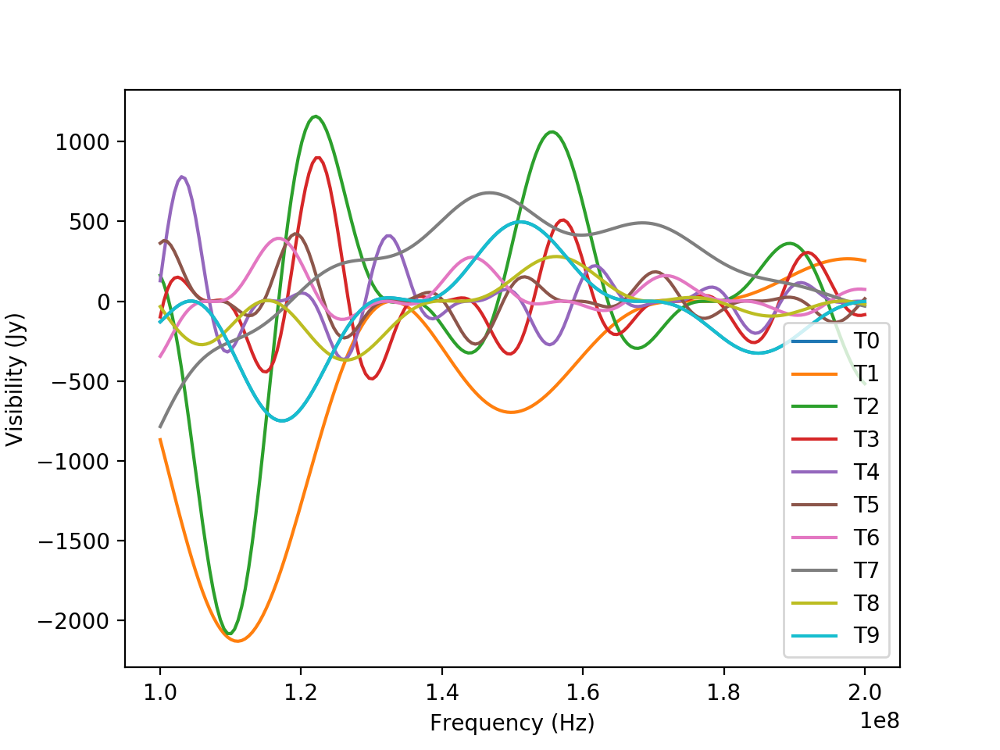

In [35]:
# Source Vis ~ 1000 Jy
plt.figure()
plt.xlabel("Frequency (Hz)")
plt.ylabel("Visibility (Jy)")
for i in range(10):
    plt.plot(test_freqs, Vtotal_test.real[i],label= "T" + str(i))
plt.legend()
plt.show()

<IPython.core.display.Javascript object>


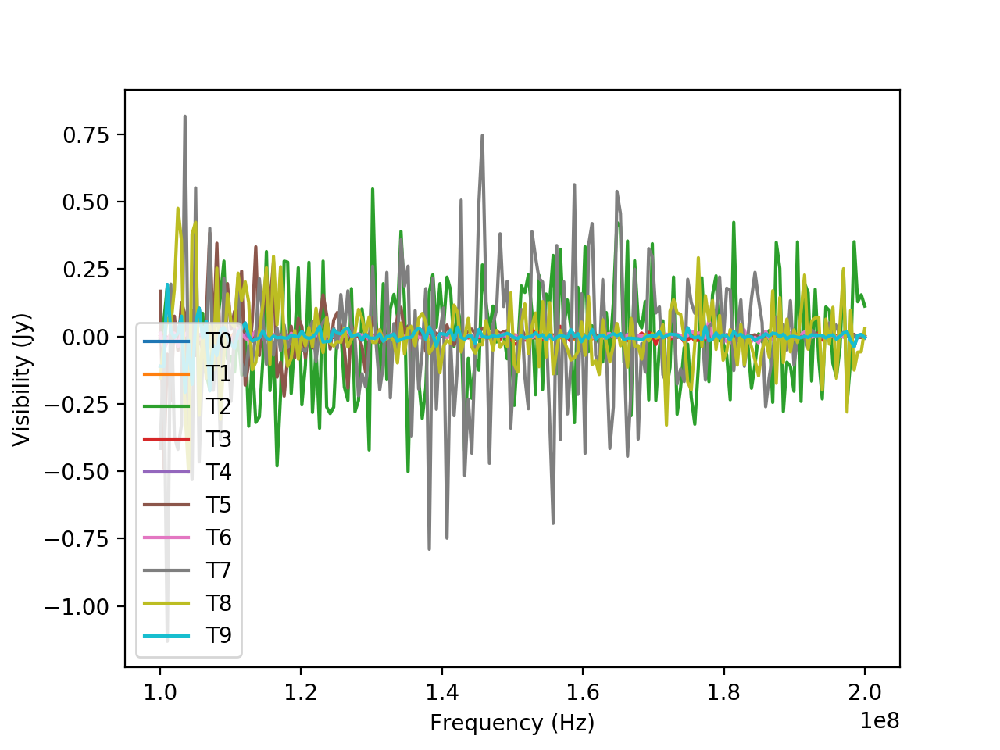

In [36]:
# White Noise Vis ~ 50 Jy 
plt.figure()
plt.xlabel("Frequency (Hz)")
plt.ylabel("Visibility (Jy)")
for i in range(10):
    plt.plot(test_freqs, noisy_Vtotal_test.real[i],label='T' + str(i))
plt.legend()
plt.show()

In [37]:
# Redefining/defining here for convenience
source_spectra = get_source_spectra(flux_vals, reffreqs, test_freqs, alphas)
antpos,antposP = generate_antpos(100.0,10,0.1)
reds = get_pos_reds(antpos)
redsP = get_pos_reds(antposP)

assert len(reds) == len(redsP), "Error: Length of redundancies do not match"

In [38]:
##### EDIT: adjust the function such that I can choose WHICH reds to go through, rather than
##### go through ALL of them

def pert_and_unpert_vis(antpos,antposP,freqs,alt,az,source_spectra):
    pert_vis_dict = {}
    unpert_vis_dict = {}
    reds = get_pos_reds(antpos)
    
    ##### [:10] TEMPORARILY HERE FOR TESTING
    for red in tqdm(reds[:10],desc='total loop time'):
        
        # processing perturbed
        setvis = []
        for bl in tqdm(red,desc='perturbed loop time',leave=False):
            pert_blvec = np.append((antposP[bl[1]] - antposP[bl[0]]),0)
            pert_vis_value = mod_vis(pert_blvec,freqs,alt,az,source_spectra)
            setvis.append(pert_vis_value)
            
        avg_pert_vis = np.average(np.array(setvis),axis=0)
        pert_vis_dict[red[0]] = avg_pert_vis
        
        # processing uneperturbed
        
        unpert_blvec = np.append((antpos[red[0][1]] - antpos[red[0][0]]),0)
        unpert_vis_value = mod_vis(unpert_blvec,freqs,alt,az,source_spectra)
        unpert_vis_dict[red[0]] = unpert_vis_value
        
    return unpert_vis_dict,pert_vis_dict

In [39]:
unpert_noise,pert_noise = pert_and_unpert_vis(antpos,antposP,test_freqs,alt,az,noisy_source_spectra)

In [40]:
# ~3-7 seconds per perturbed loop, 180 loops total
unpert_vis,pert_vis = pert_and_unpert_vis(antpos,antposP,test_freqs,alt,az,source_spectra)

In [41]:
def fft_freqs(freqs):
    '''Returns the Fourier transform of Frequency (Delay) in nanoseconds'''
    return 1e9*np.fft.fftshift(np.fft.fftfreq(len(test_freqs),d=(test_freqs[1]-test_freqs[0])))

In [42]:
### Pass in Value instead of the dictionary and the key; this current method limits what I can do
### with it

def fft_vis_dict(vis_dict,key,window):
    '''Return Fourier transform of visibilities in a dictionary, based on "window"
    generated by scipy.signal.blackmanharris(length of frequencies)'''
    return np.fft.fftshift(np.abs(np.fft.fft(window*vis_dict[key][0]))**2)

In [43]:
delays = fft_freqs(test_freqs)
# be sure to use the same window for pert and unpert
window = scipy.signal.blackmanharris(len(test_freqs))

<IPython.core.display.Javascript object>


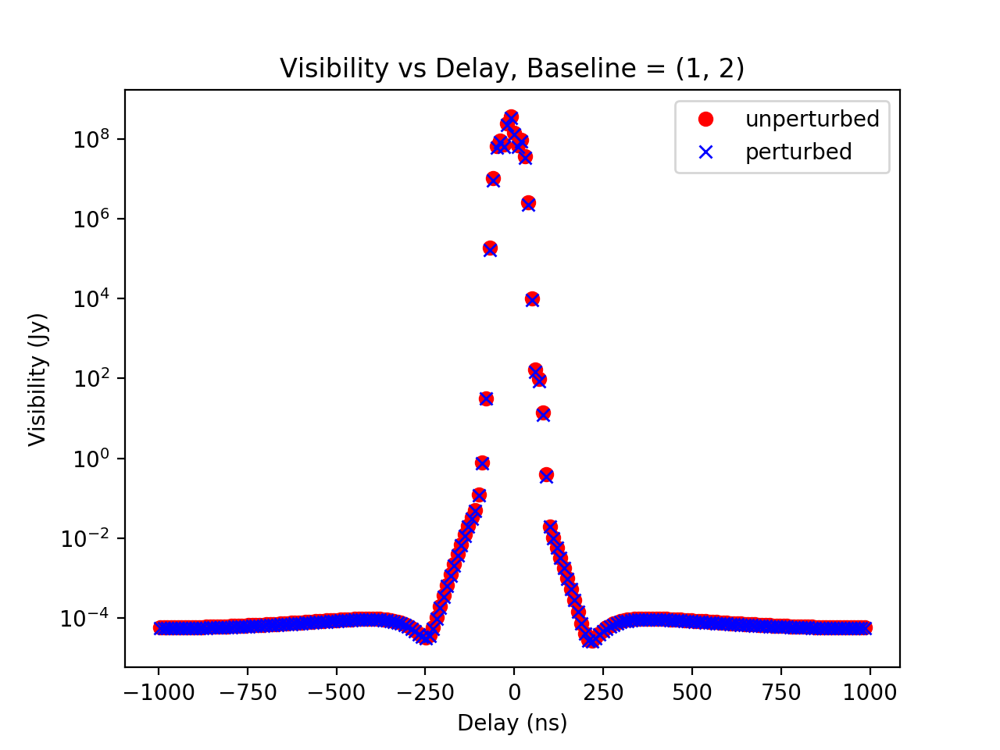

<IPython.core.display.Javascript object>


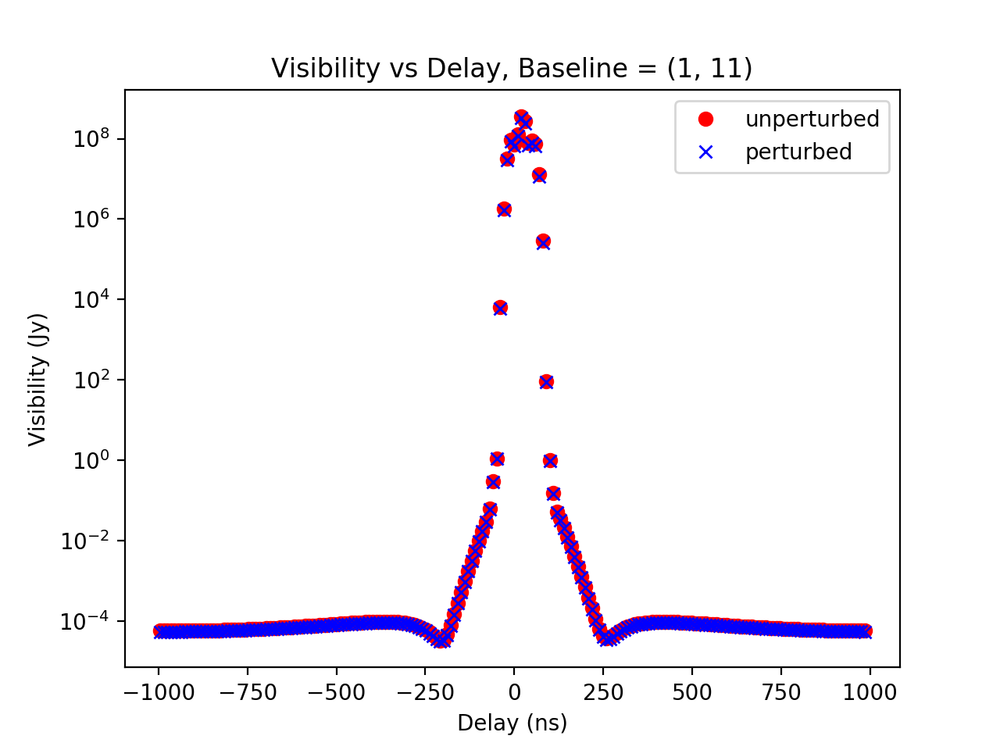

<IPython.core.display.Javascript object>


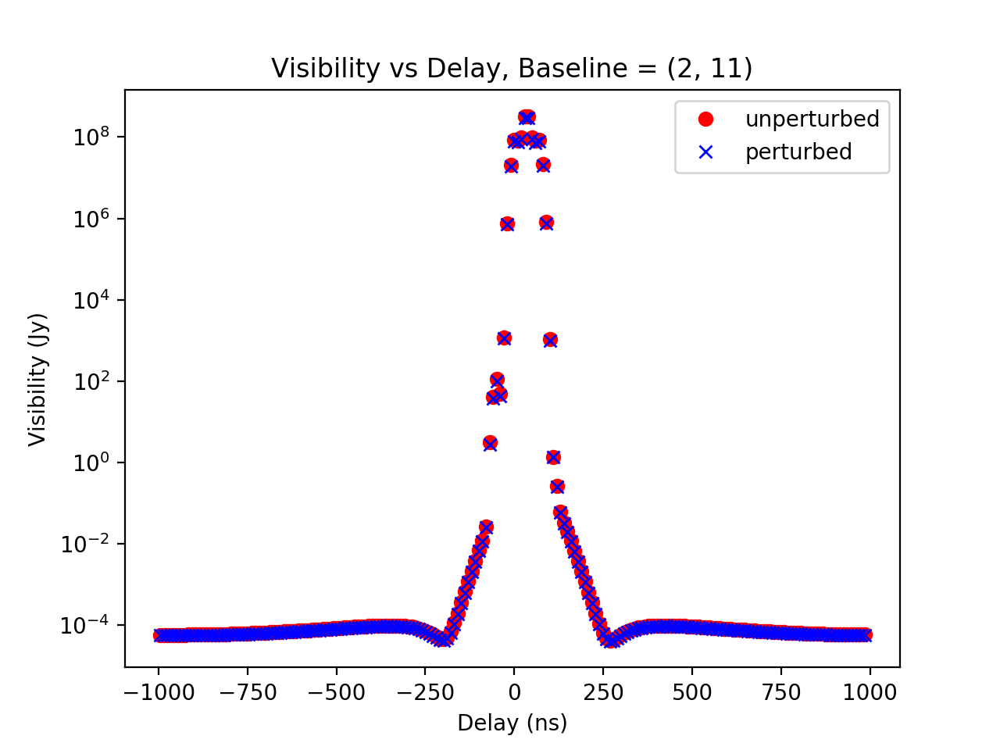

<IPython.core.display.Javascript object>


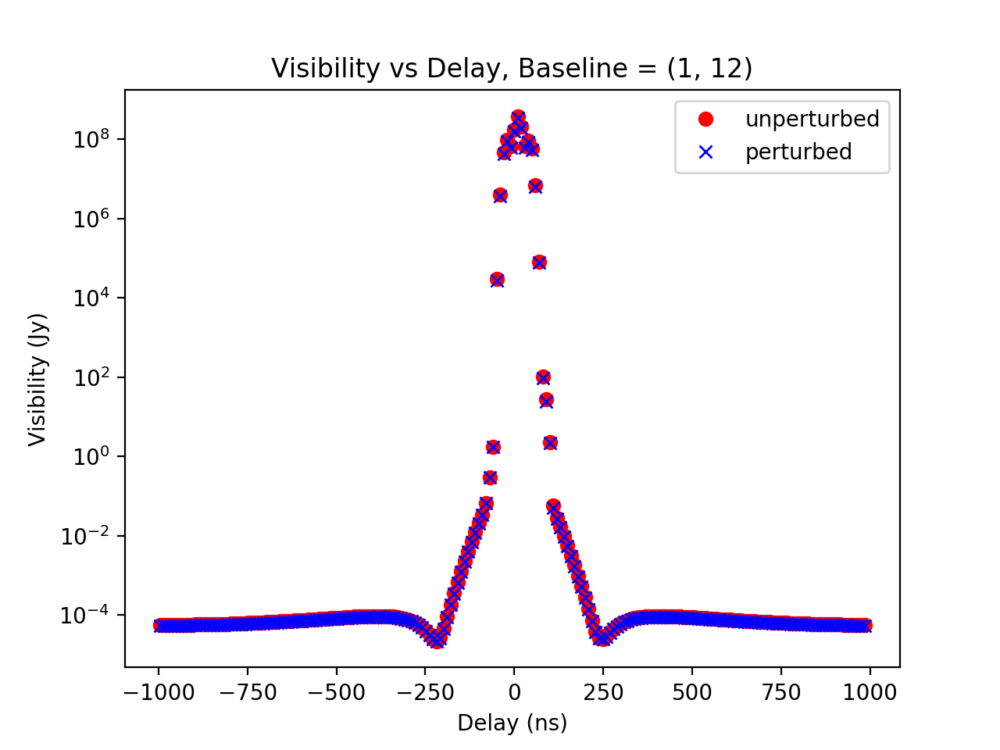

<IPython.core.display.Javascript object>


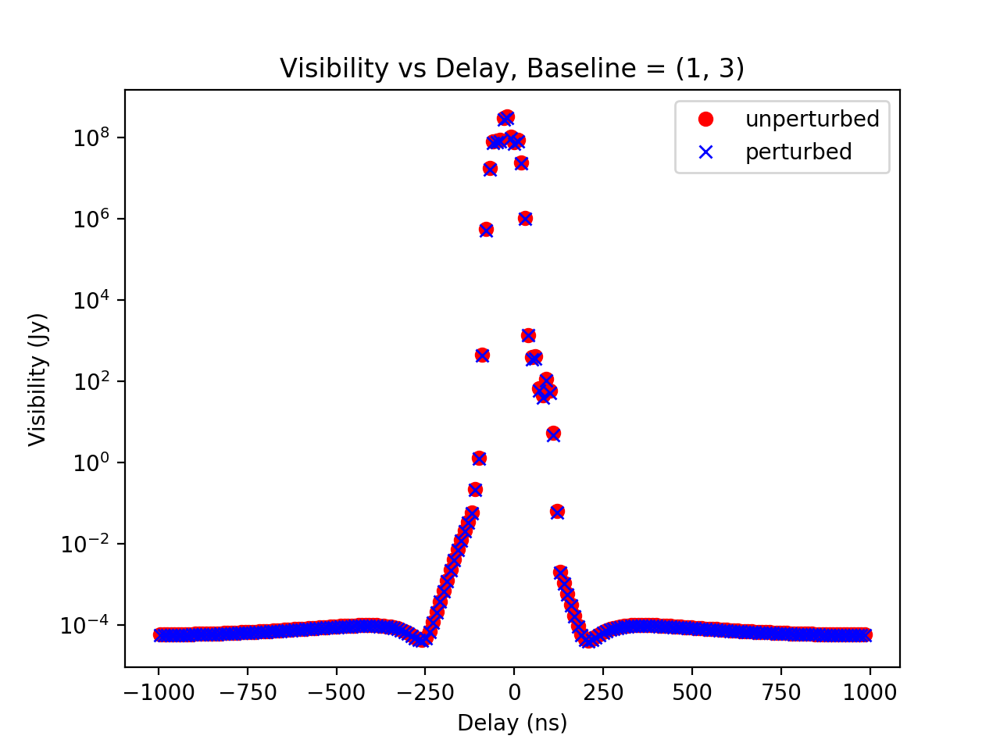

<IPython.core.display.Javascript object>


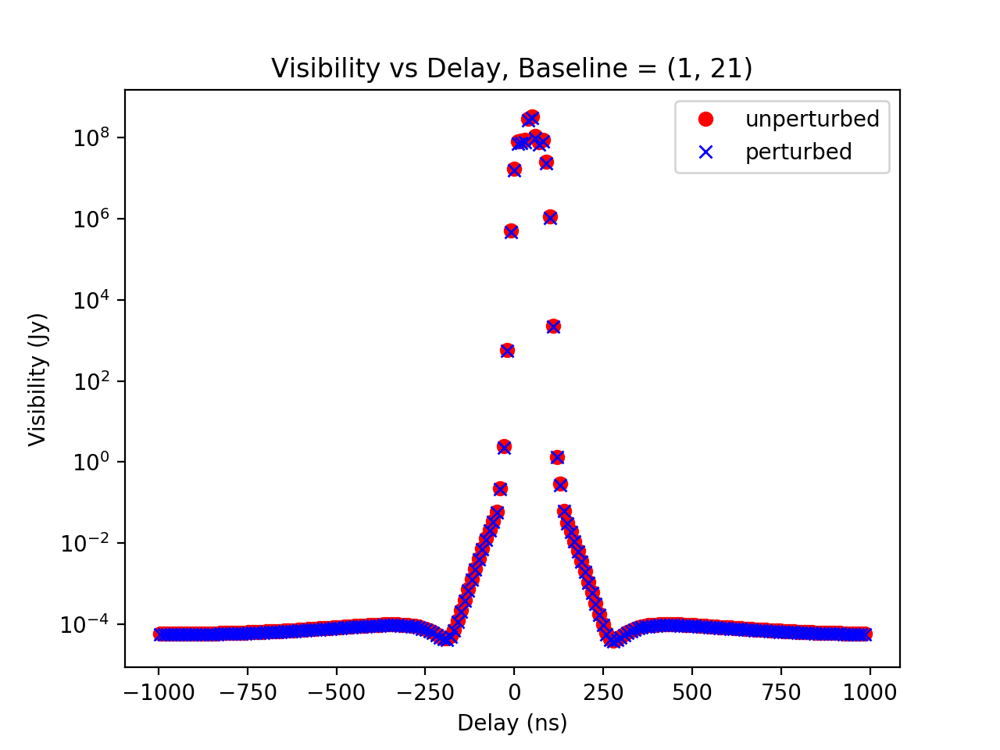

<IPython.core.display.Javascript object>


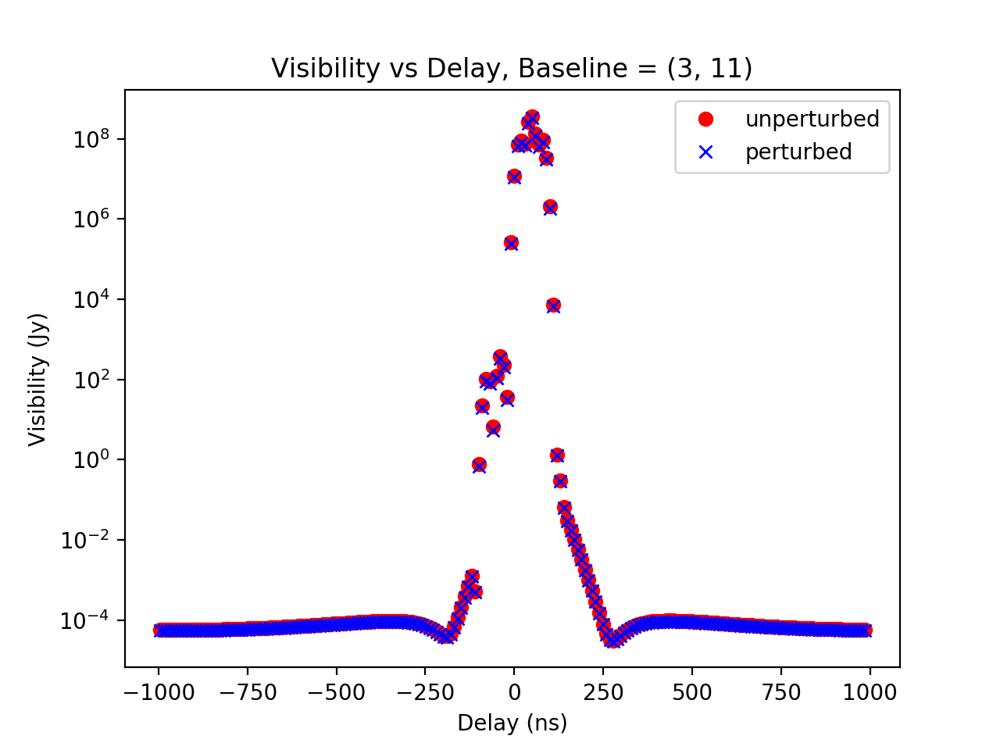

<IPython.core.display.Javascript object>


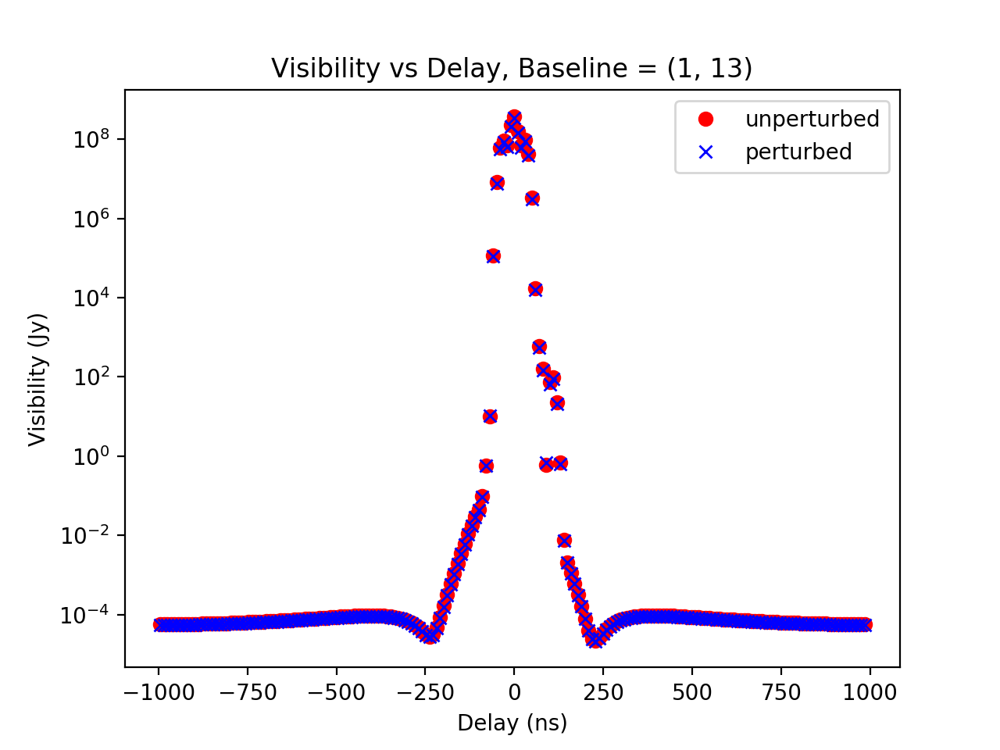

<IPython.core.display.Javascript object>


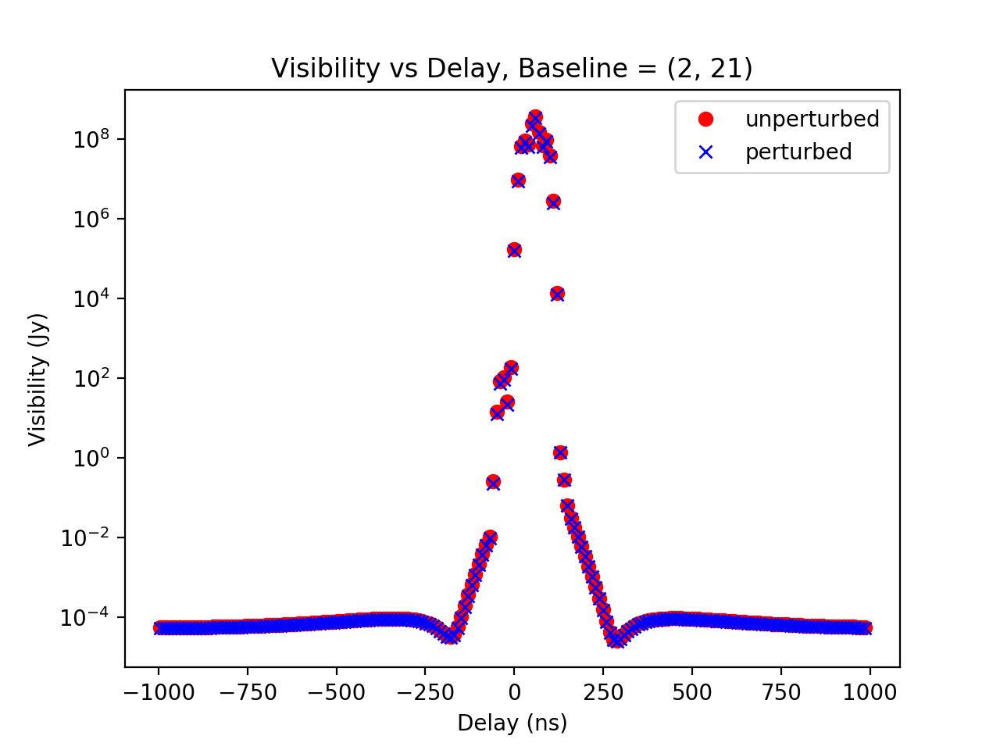

<IPython.core.display.Javascript object>


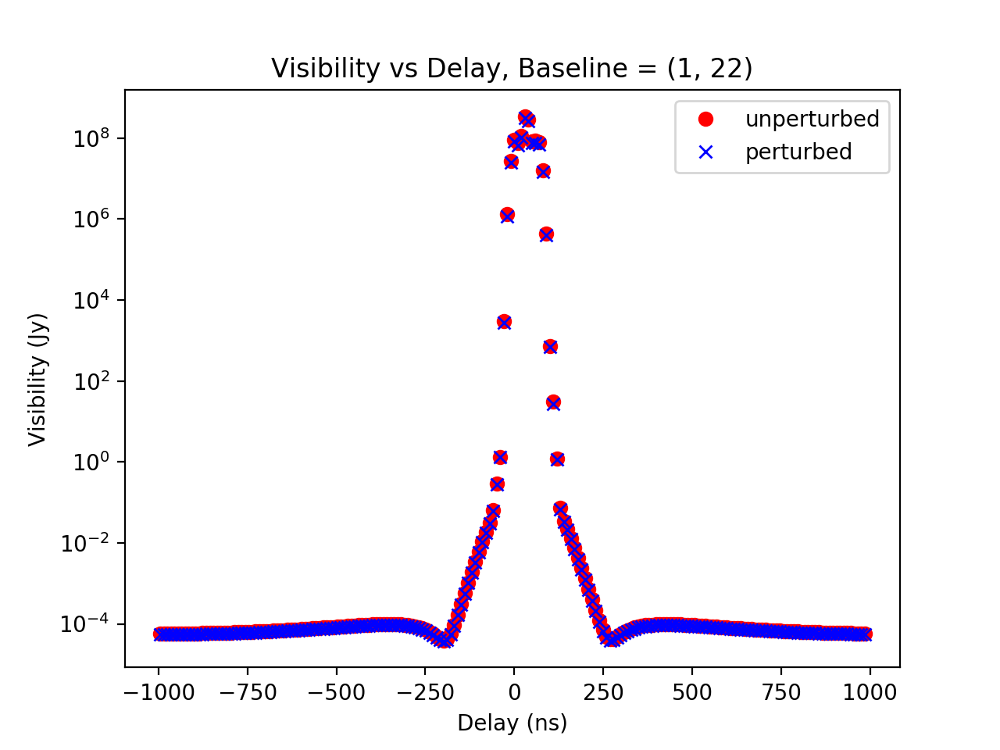

In [44]:
for key in unpert_vis:
    plt.figure()
    plt.title('Visibility vs Delay, Baseline = ' + str(key))
    plt.xlabel('Delay (ns)')
    plt.ylabel('Visibility (Jy)')
    # notice the tapering effect as a result of doing this
    plt.semilogy(delays,fft_vis_dict(unpert_vis,key,window),'ro',label='unperturbed')
    plt.semilogy(delays,fft_vis_dict(pert_vis,key,window),'bx',label='perturbed')
    plt.legend()
    # be sure to use the same windows for both pert and unpert
plt.show()

In [129]:
unpert_vis

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()


<IPython.core.display.Javascript object>


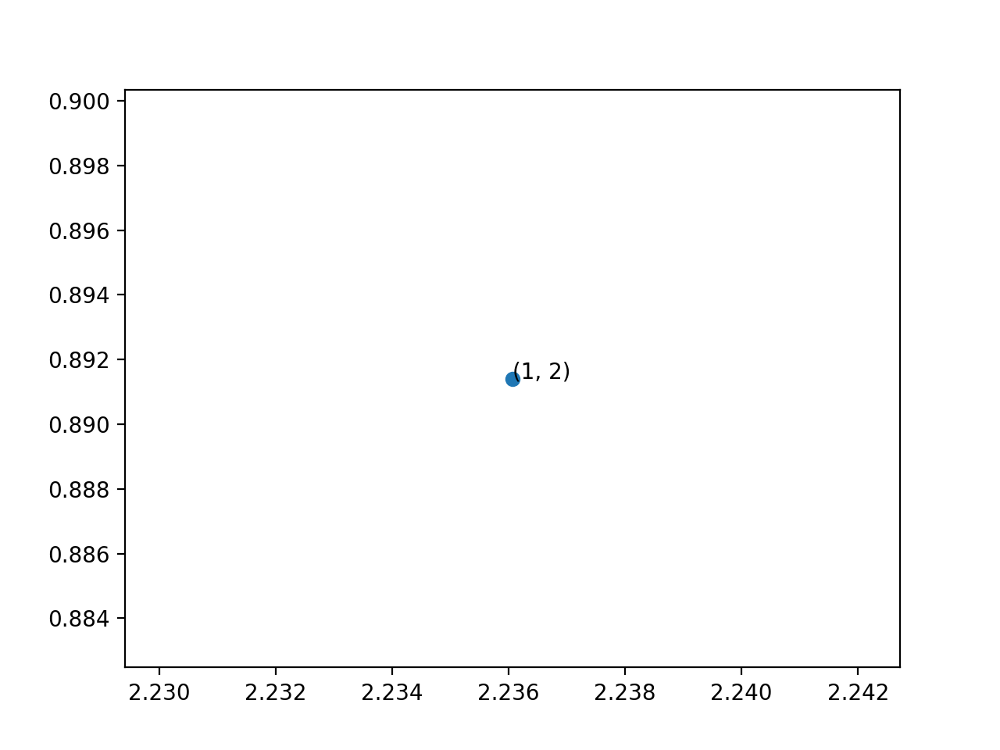

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


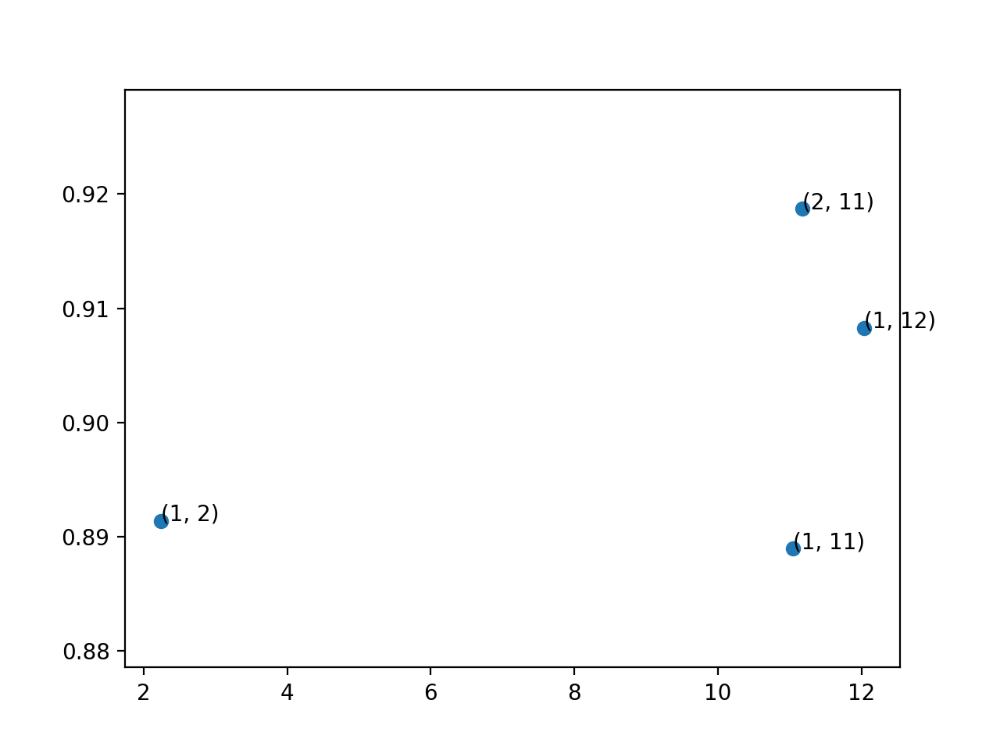

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


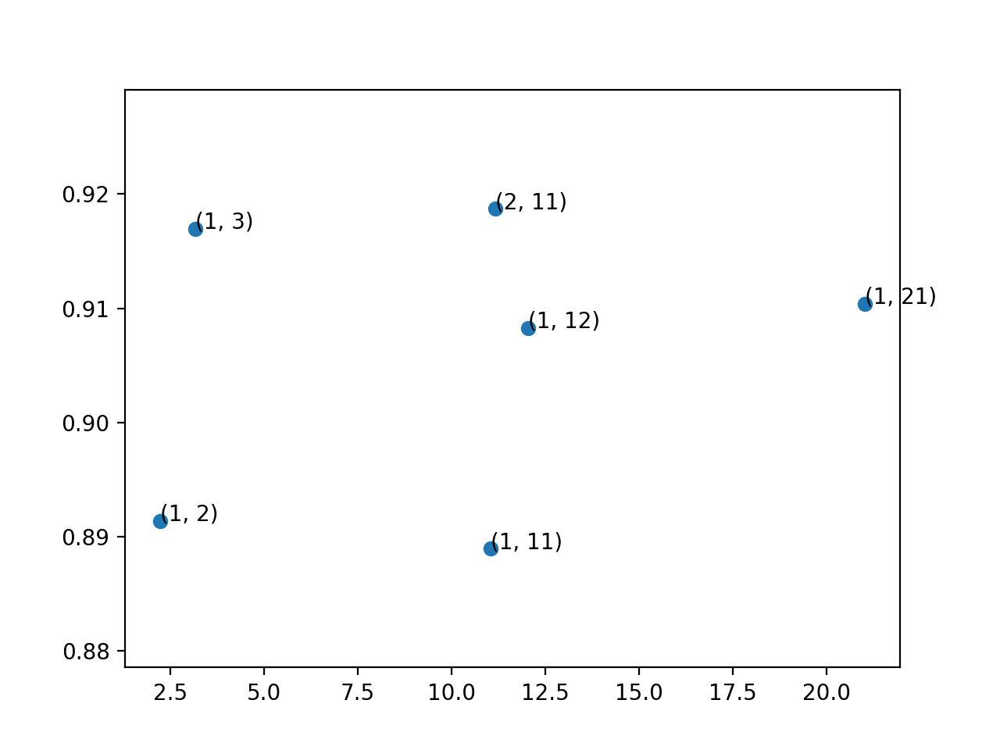

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


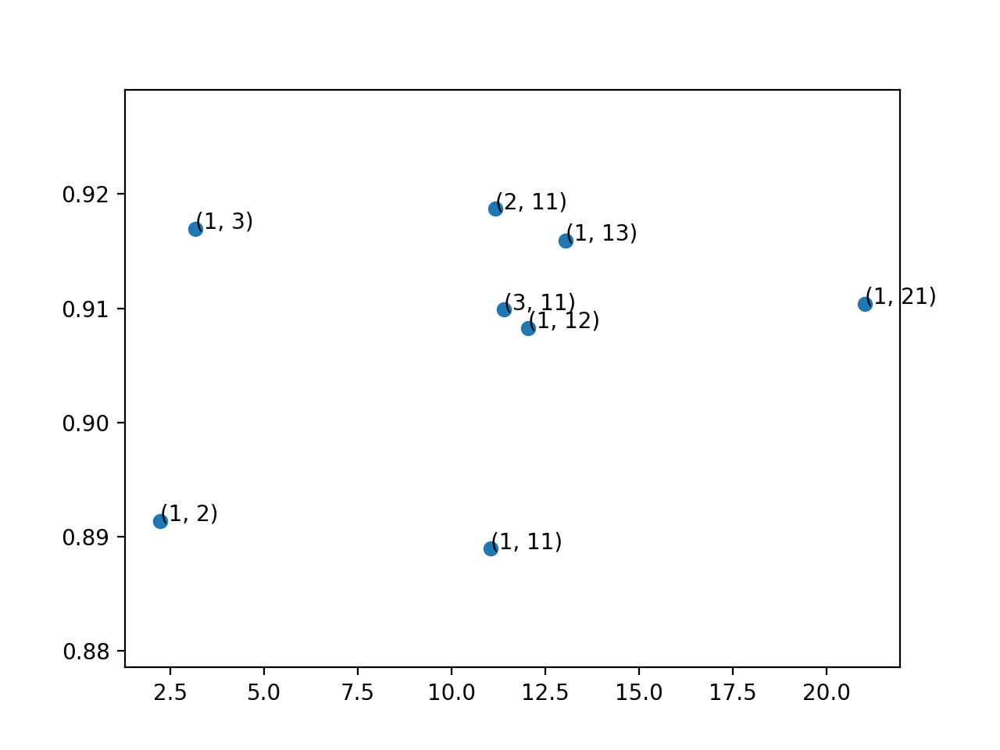

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


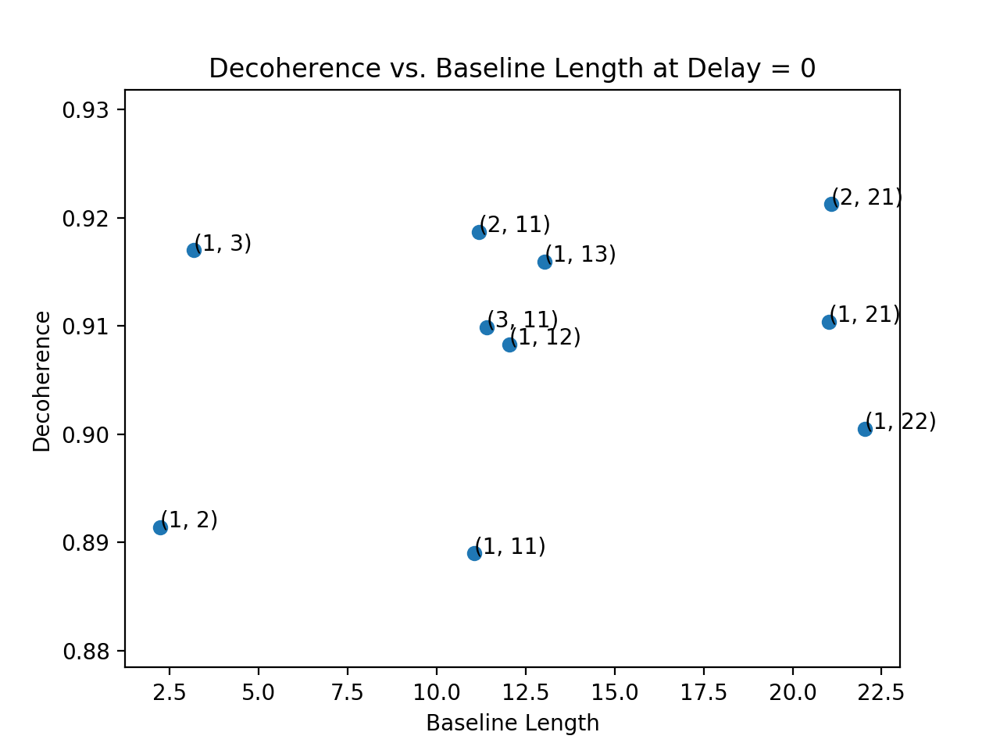

In [127]:
b_lengths = []
deco = []
idx = np.where(delays == 0)
for key in unpert_vis:
    denom = fft_vis_dict(unpert_vis,key,window)[idx]
    num = fft_vis_dict(pert_vis,key,window)[idx]
    length = np.sqrt(key[0]**2 + key[1]**2)
    deco.append(num/denom)
    b_lengths.append(length)

    fig, ax2 = plt.subplots()
    ax2.scatter(b_lengths,deco)

    for j in range(len(b_lengths)):
        key = list(unpert_vis.keys())[j]
        ax2.annotate(key,(b_lengths[j],deco[j]))
        
plt.title("Decoherence vs. Baseline Length at Delay = 0")
plt.xlabel("Baseline Length")
plt.ylabel("Decoherence")
plt.show()

<IPython.core.display.Javascript object>


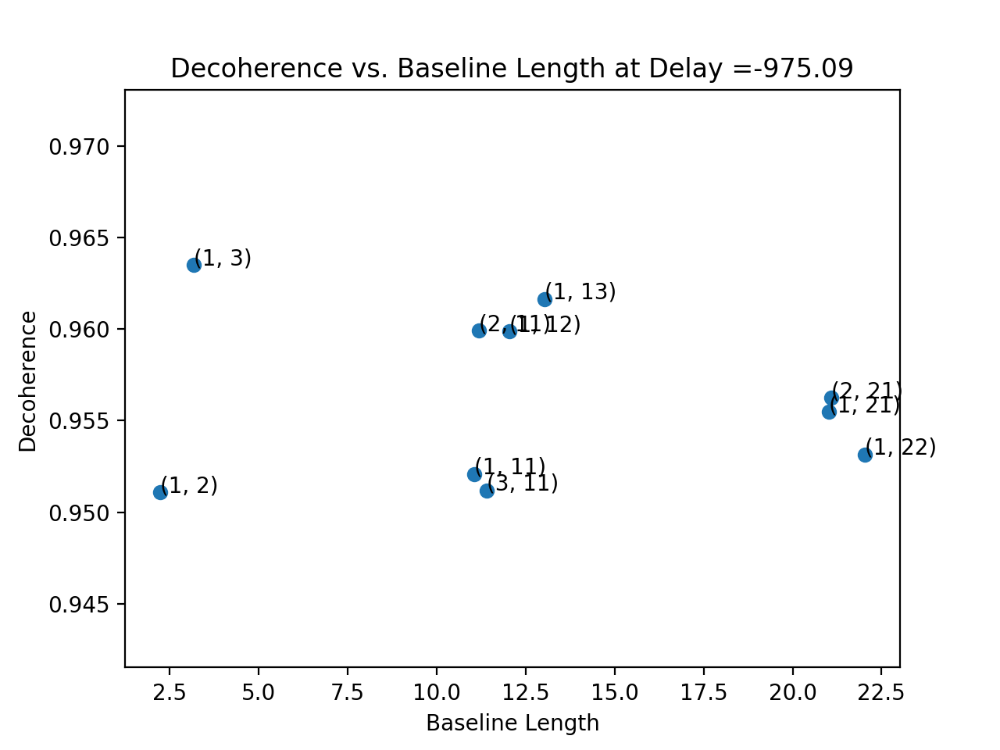

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


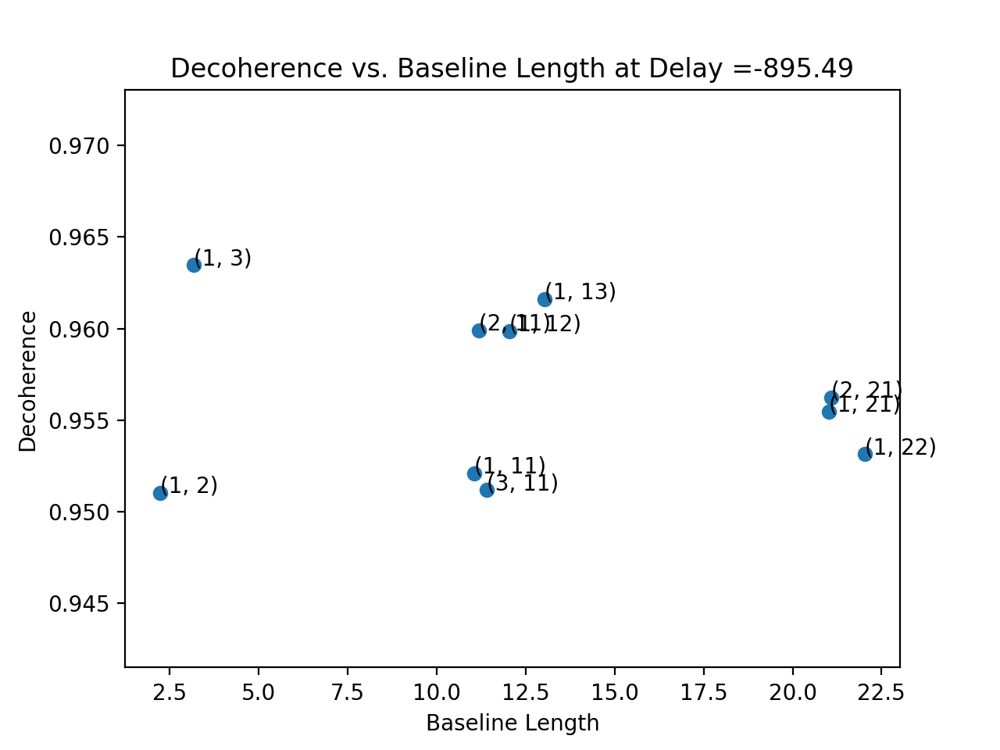

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


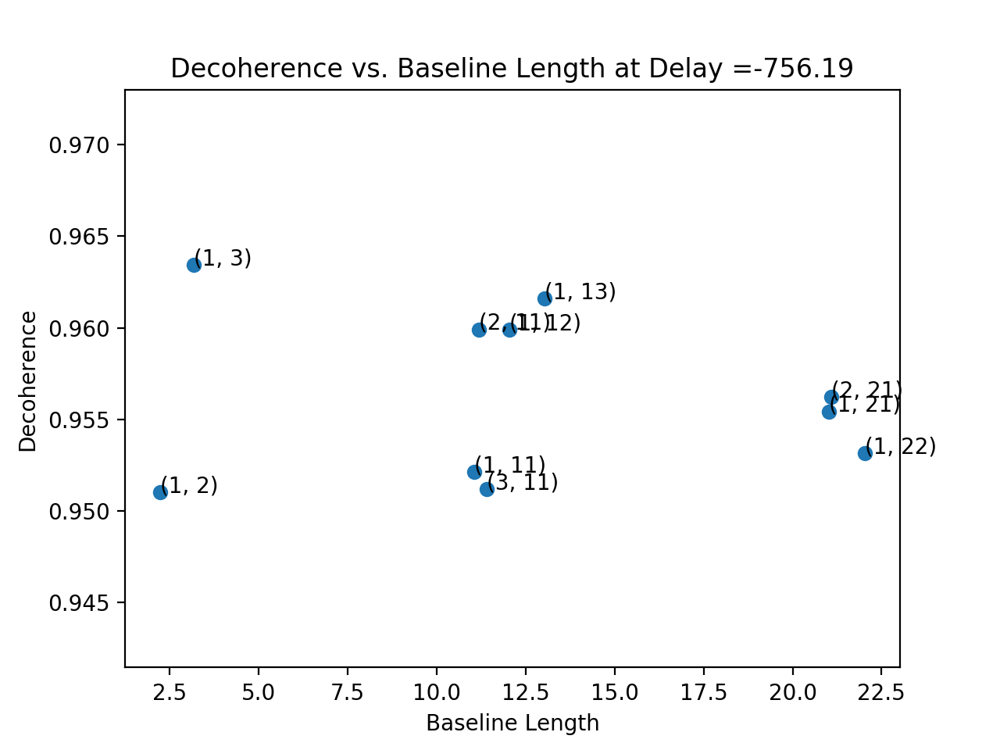

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


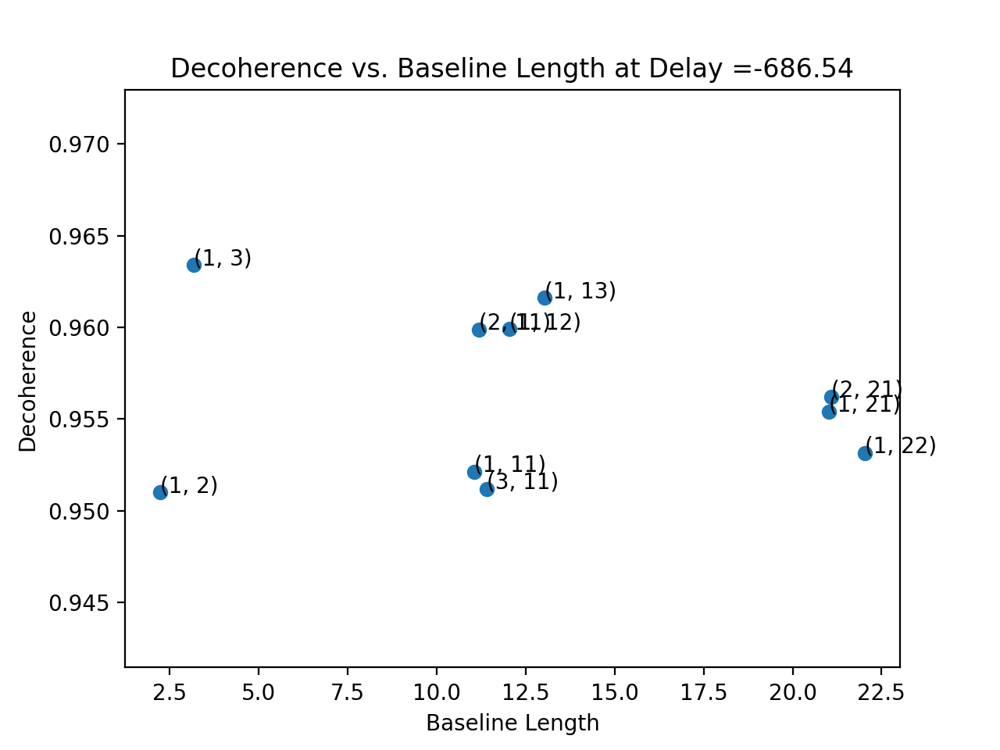

<IPython.core.display.Javascript object>


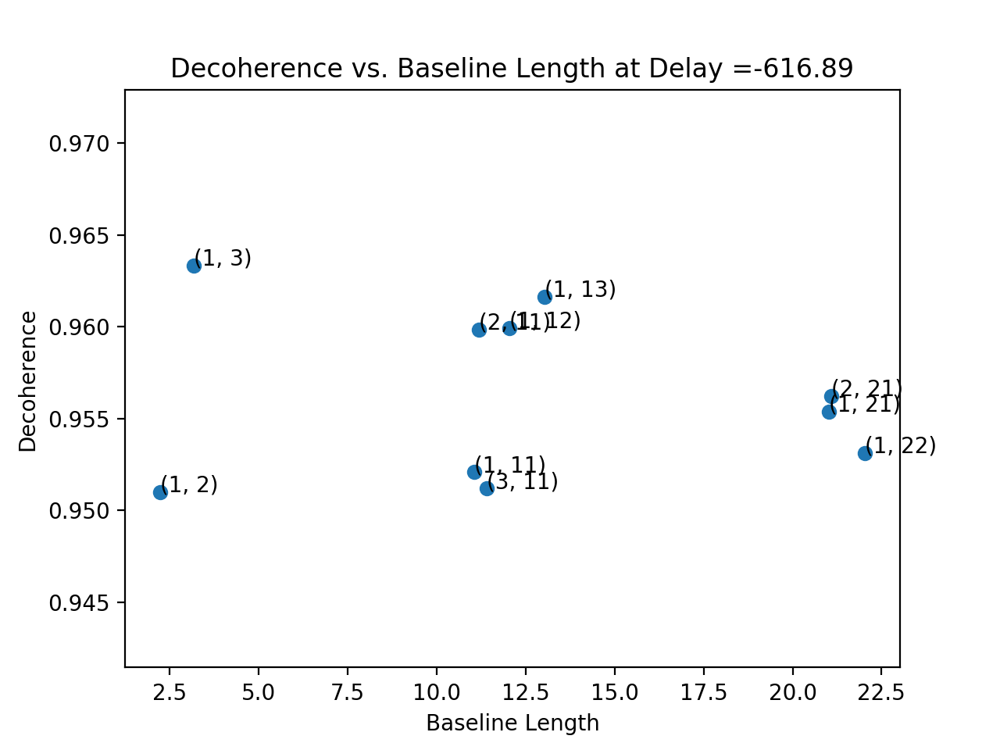

<IPython.core.display.Javascript object>


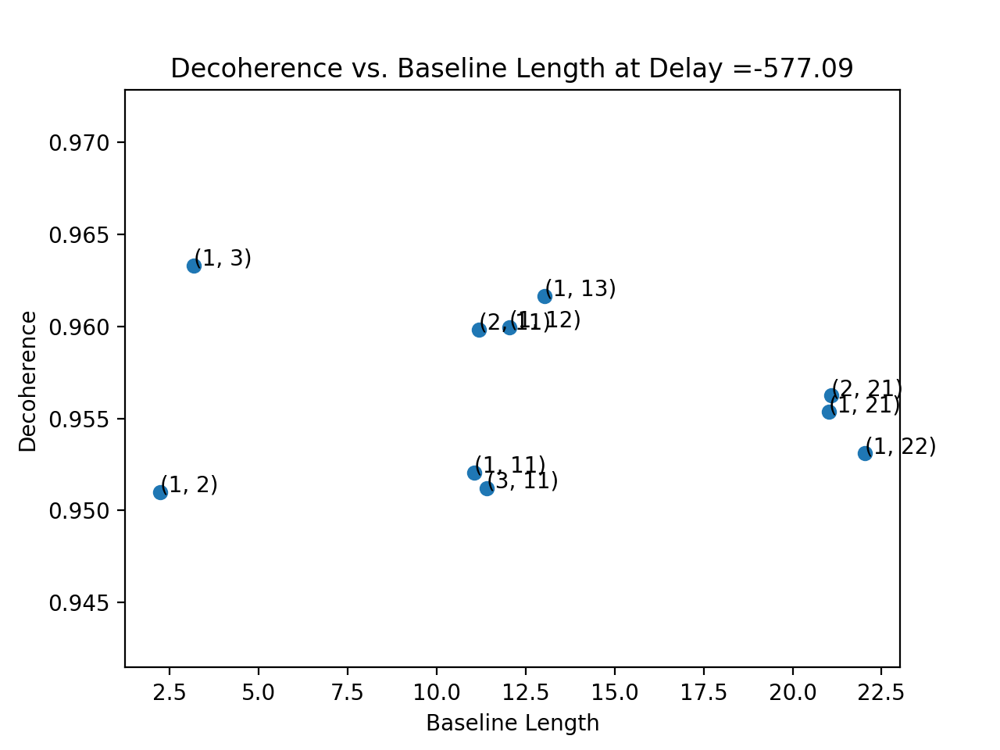

<IPython.core.display.Javascript object>


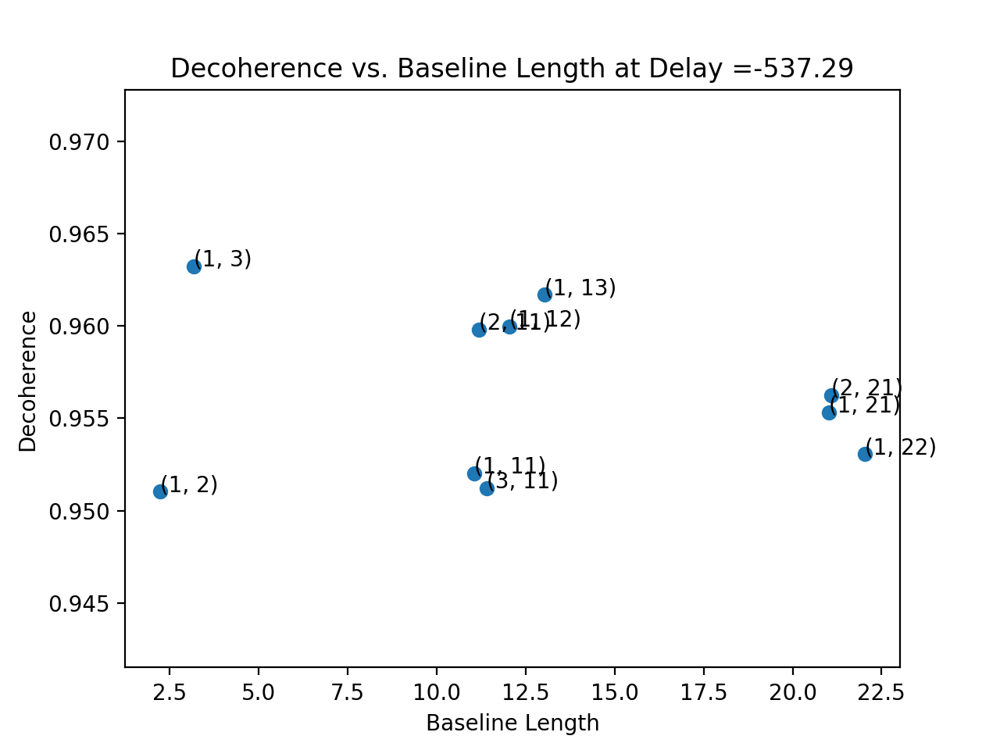

<IPython.core.display.Javascript object>


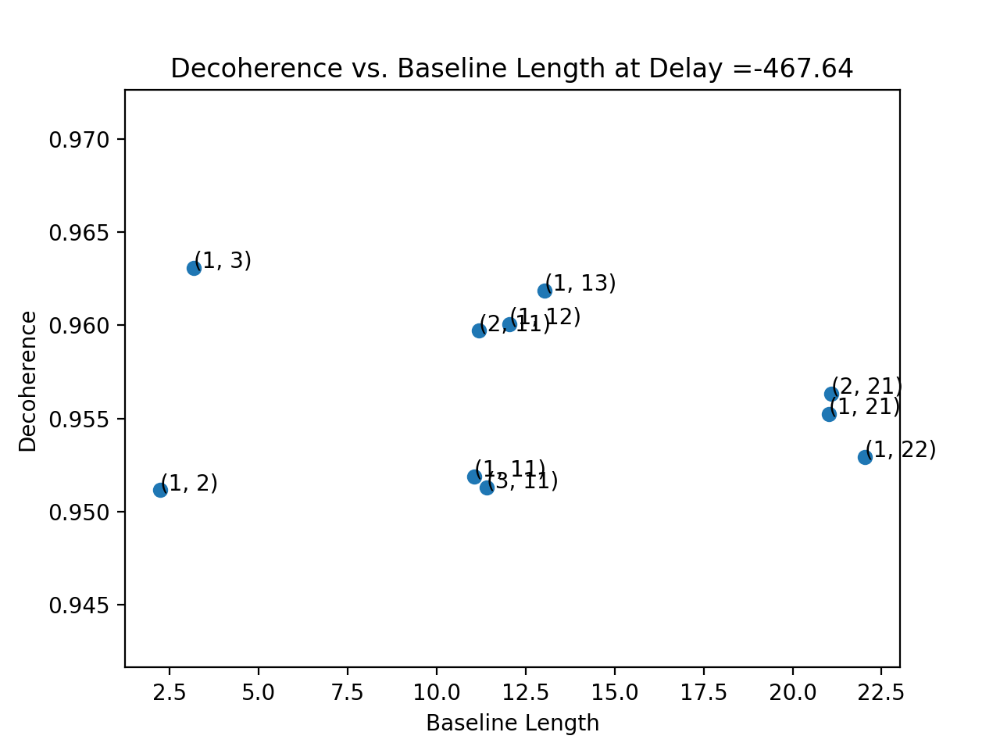

<IPython.core.display.Javascript object>


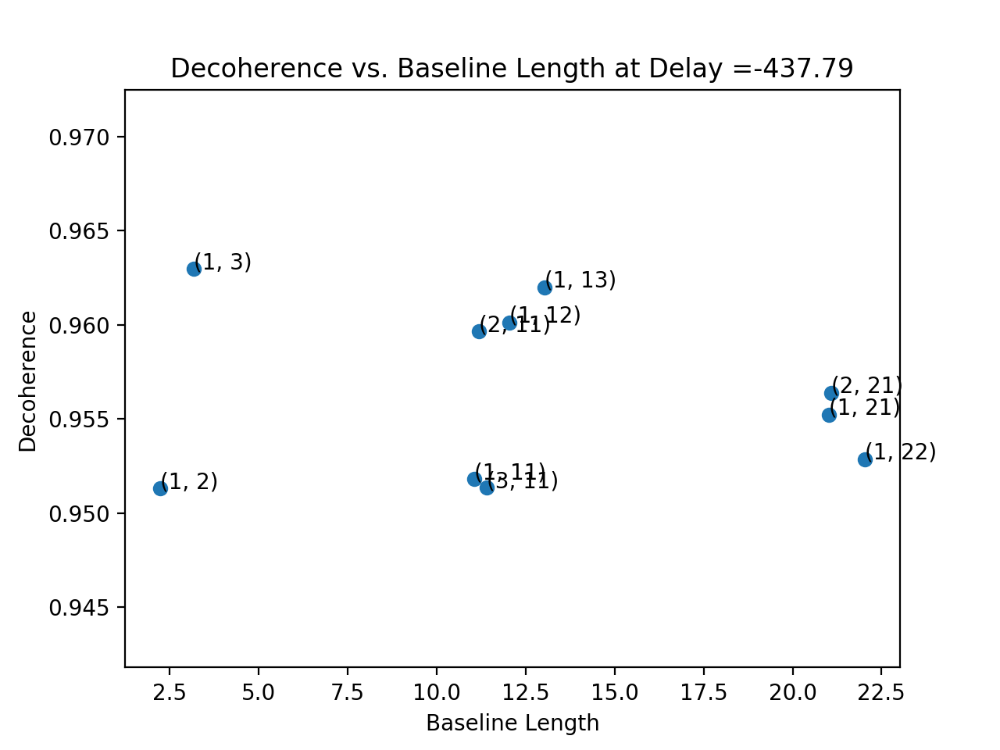

<IPython.core.display.Javascript object>


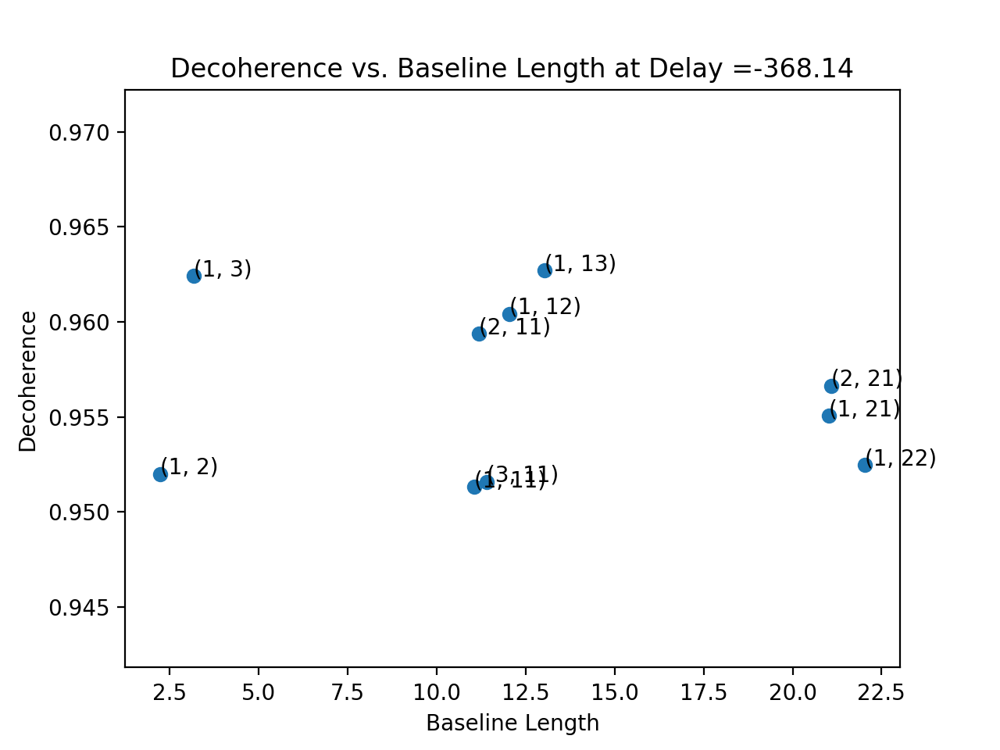

<IPython.core.display.Javascript object>


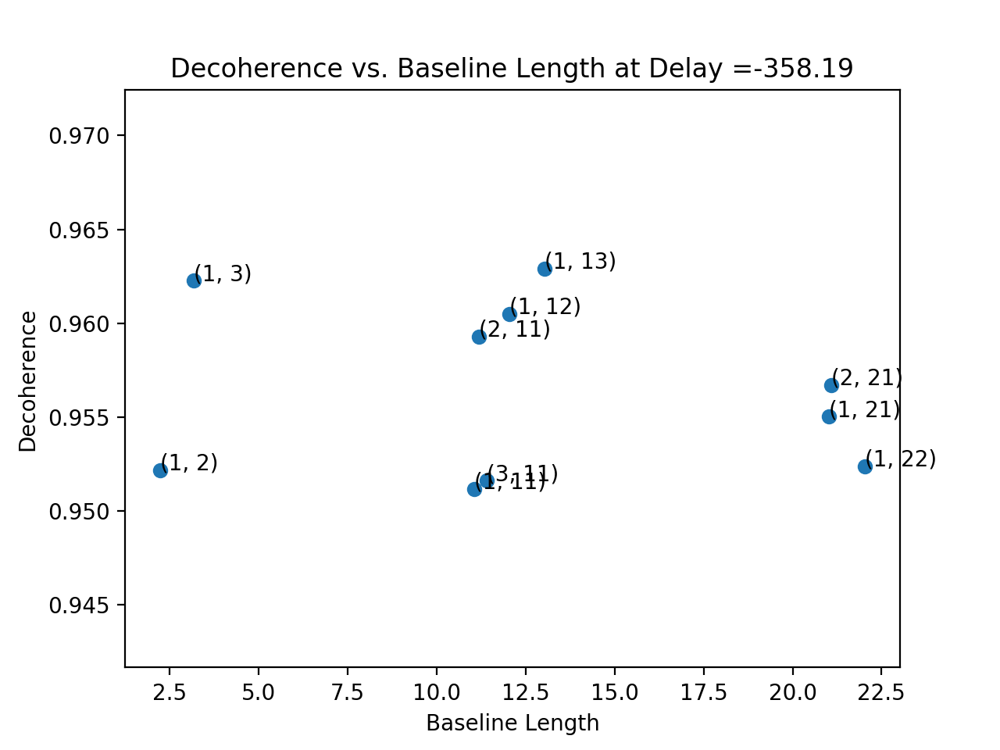

<IPython.core.display.Javascript object>


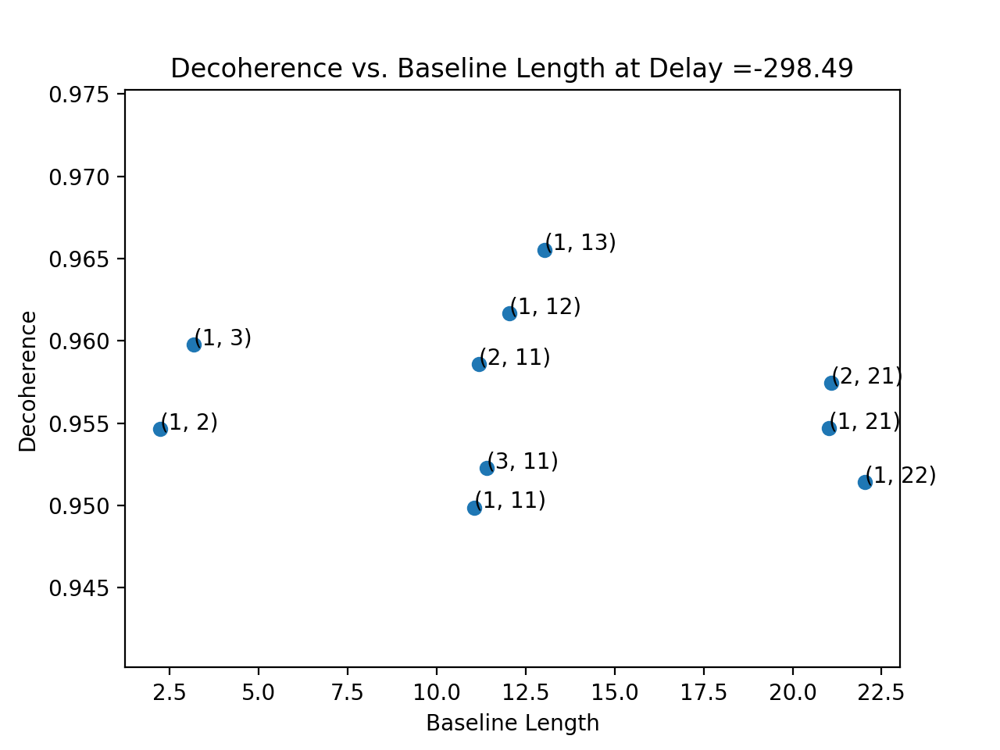

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


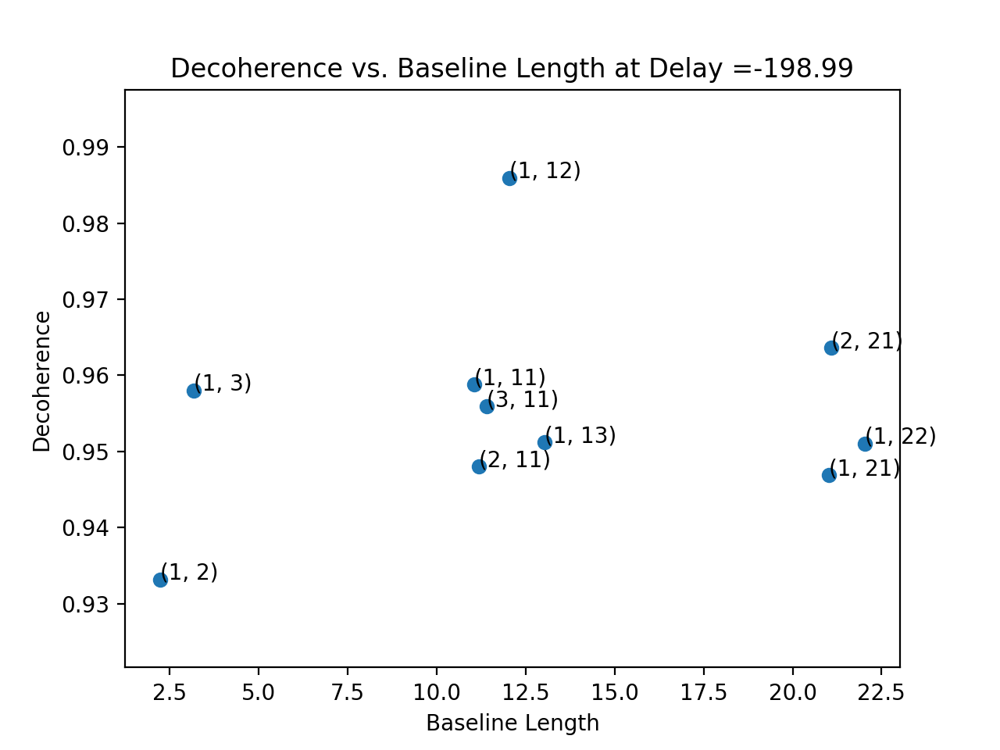

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


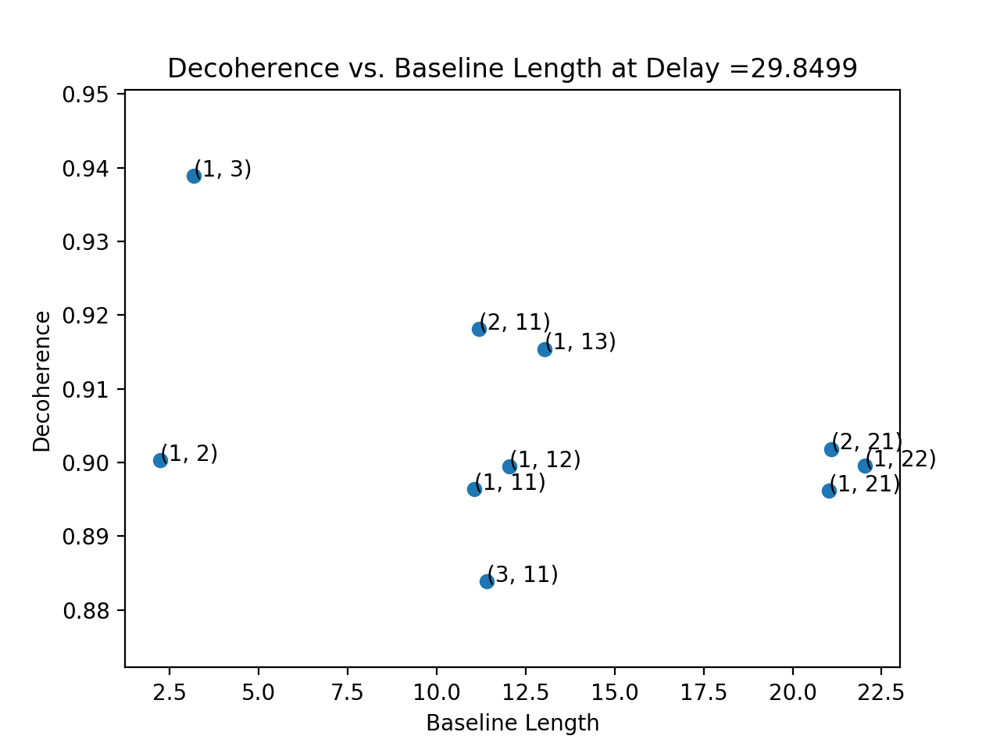

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


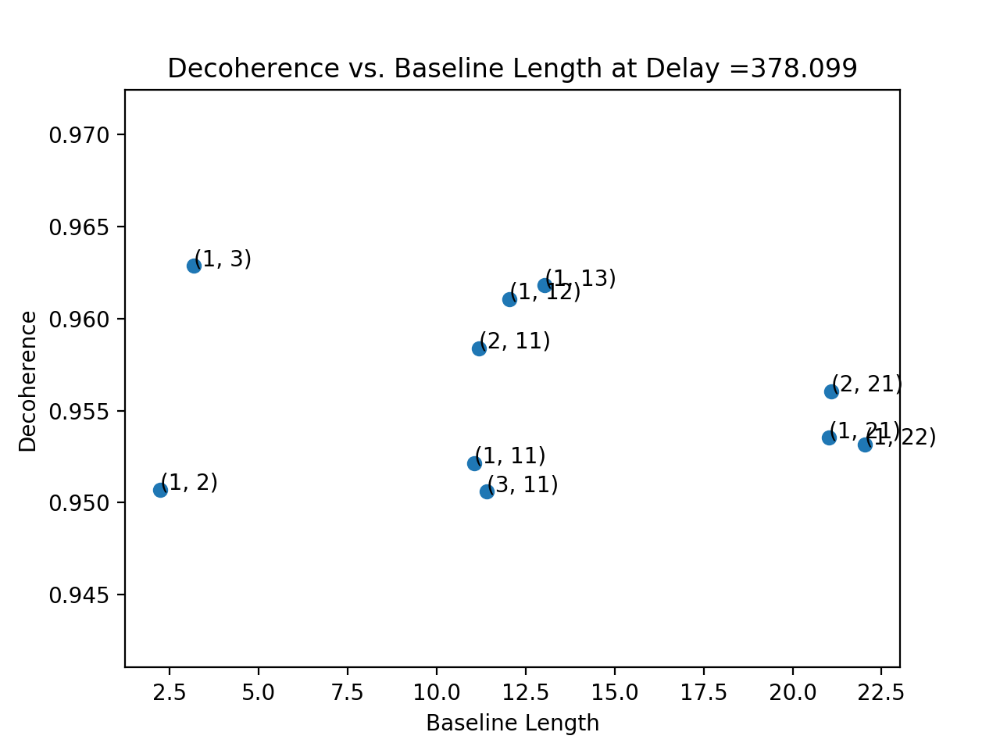

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


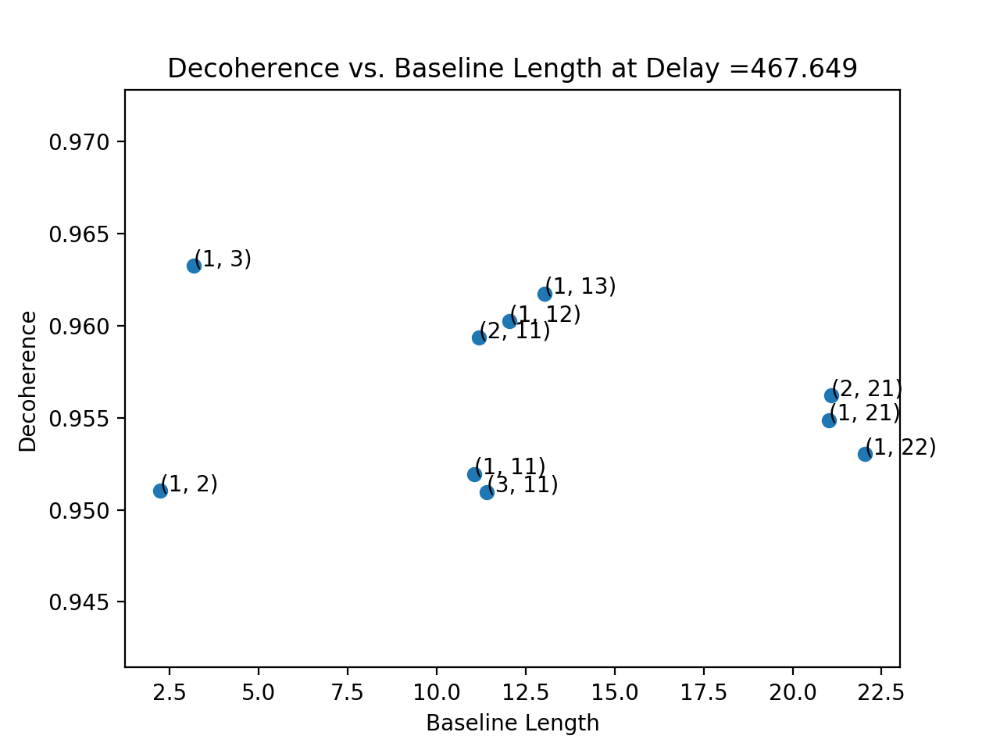

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


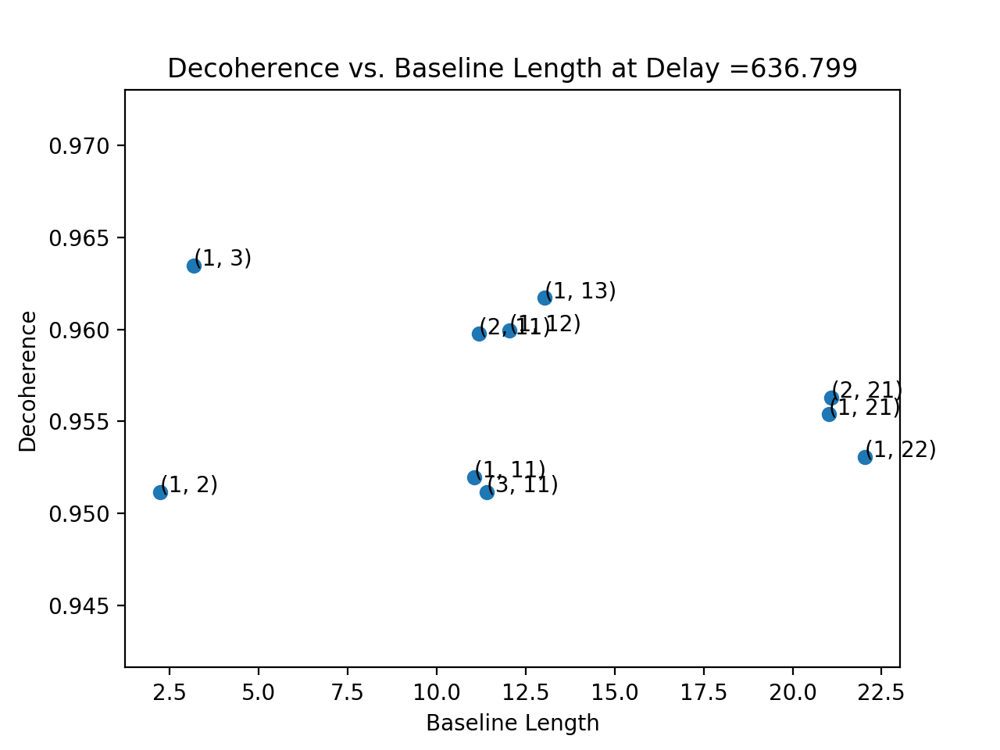

<IPython.core.display.Javascript object>


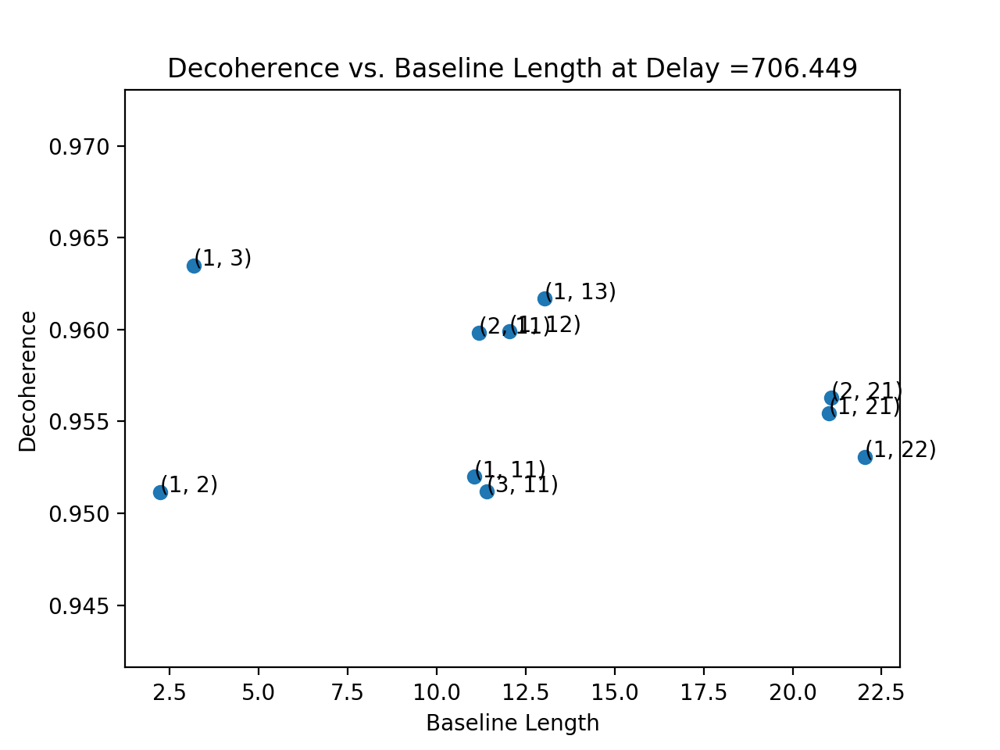

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


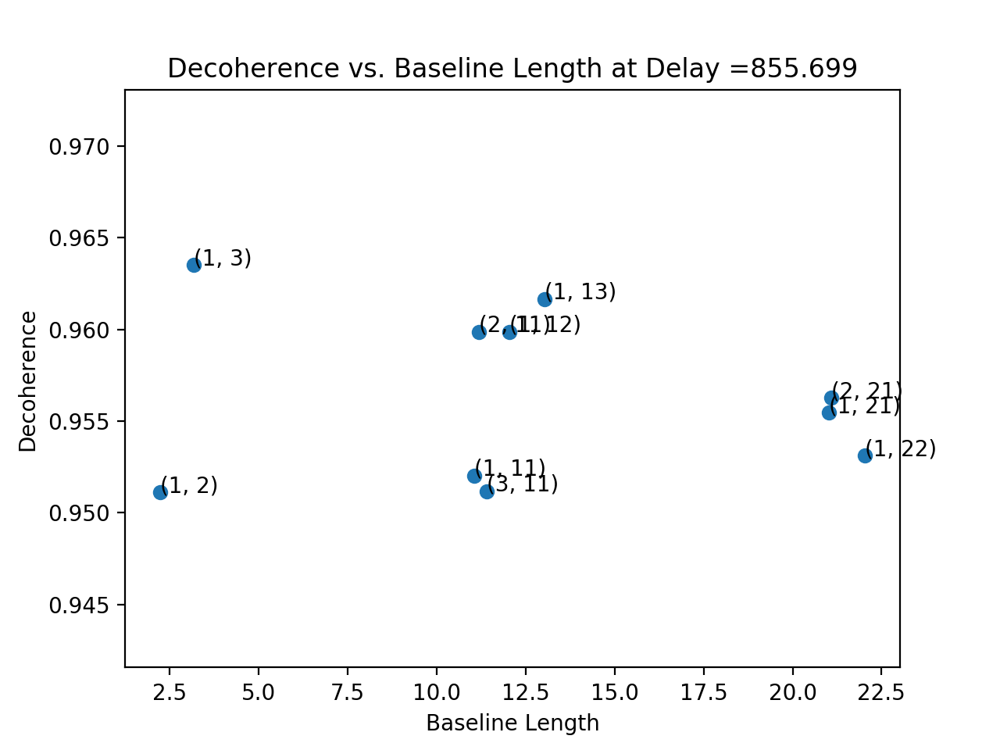

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


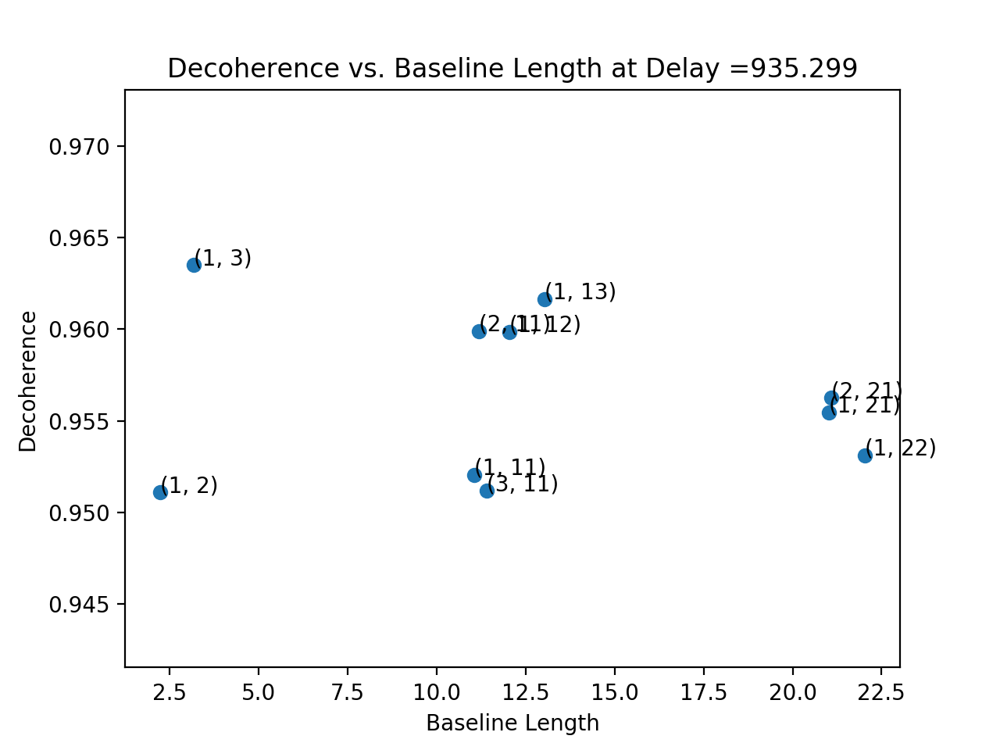

<IPython.core.display.Javascript object>

In [128]:
for i in range(len(delays)):
    
    b_lengths = []
    deco = []
    for key in unpert_vis:
        denom = fft_vis_dict(unpert_vis,key,window)[i]
        num = fft_vis_dict(pert_vis,key,window)[i]
        length = np.sqrt(key[0]**2 + key[1]**2)
        deco.append(num/denom)
        b_lengths.append(length)

    fig, ax = plt.subplots()
    ax.scatter(b_lengths,deco)

    for j in range(len(b_lengths)):
        key = list(unpert_vis.keys())[j]
        ax.annotate(key,(b_lengths[j],deco[j]))
    
    title_str = str(delays[i])
    plt.title("Decoherence vs. Baseline Length at Delay =" + title_str[:7])
    plt.xlabel("Baseline Length")
    plt.ylabel("Decoherence")
    plt.show()

<IPython.core.display.Javascript object>


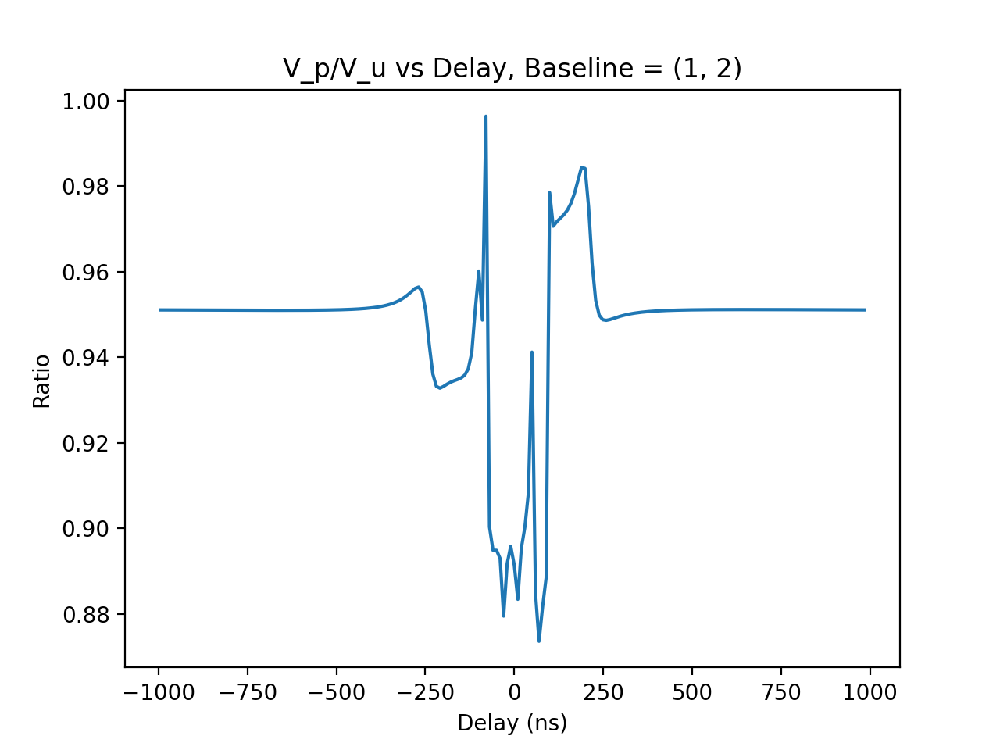

<IPython.core.display.Javascript object>


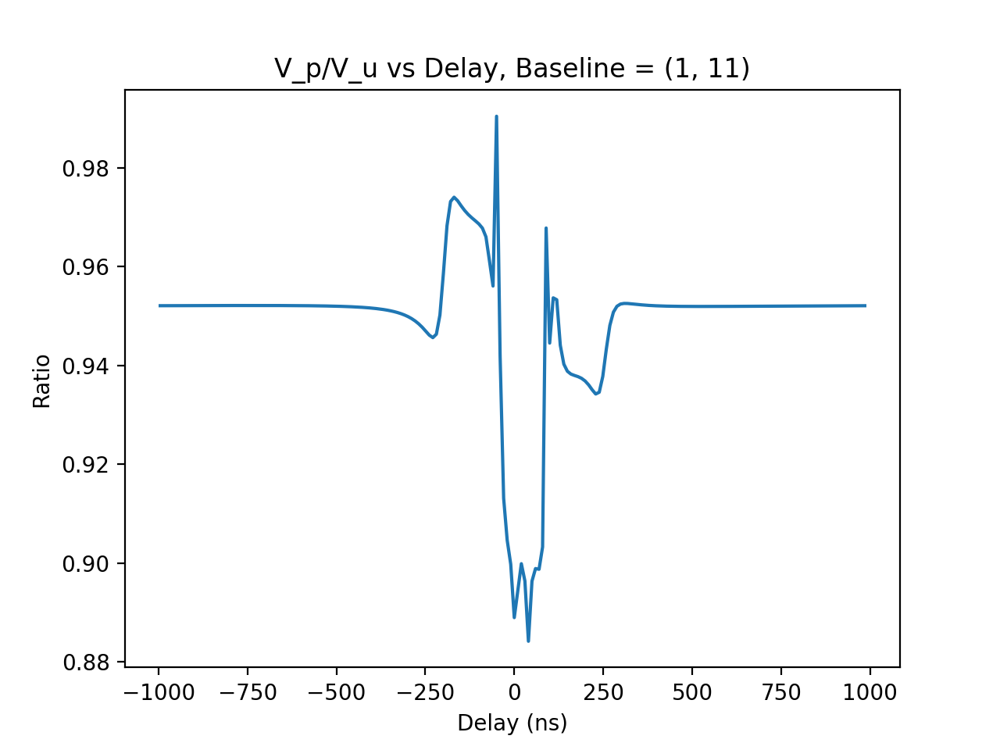

<IPython.core.display.Javascript object>


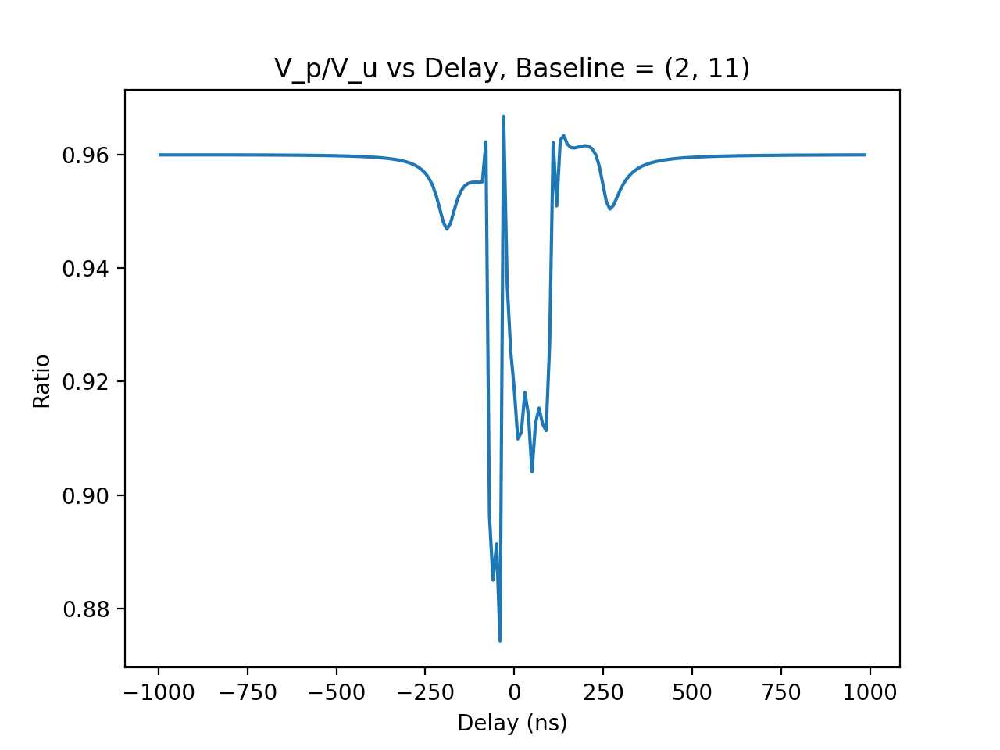

<IPython.core.display.Javascript object>


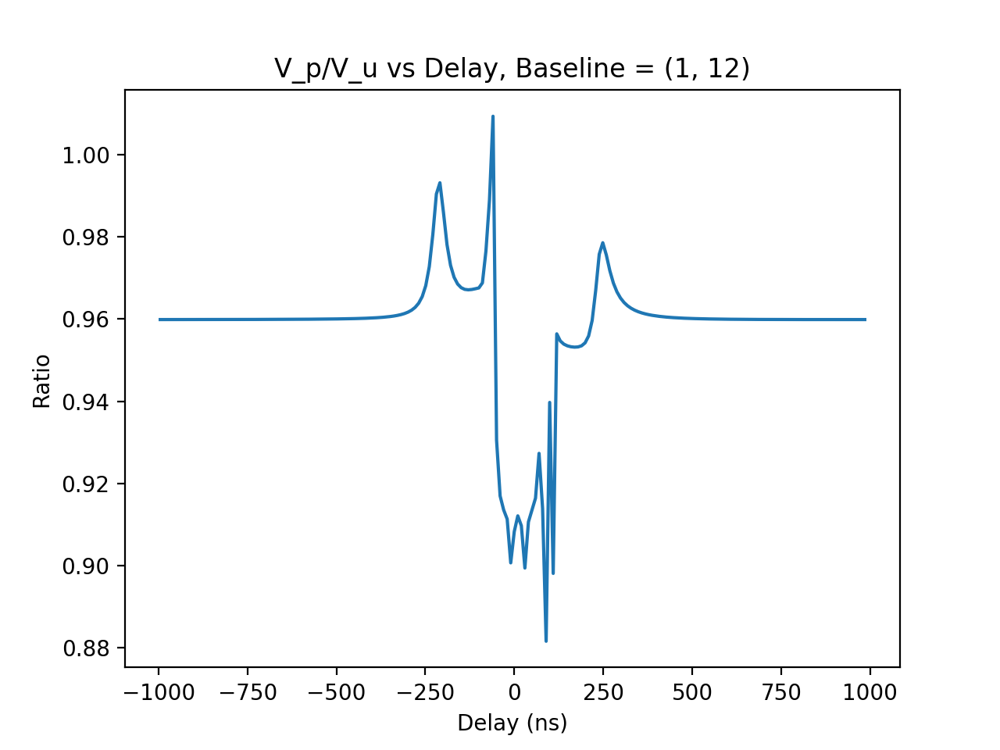

<IPython.core.display.Javascript object>


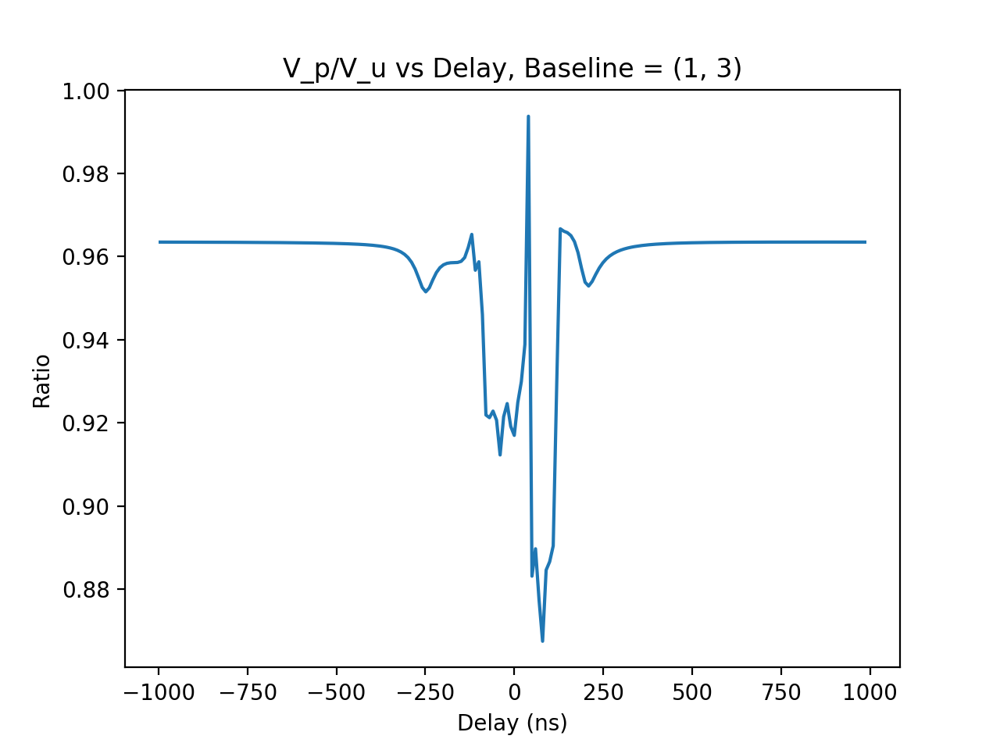

<IPython.core.display.Javascript object>


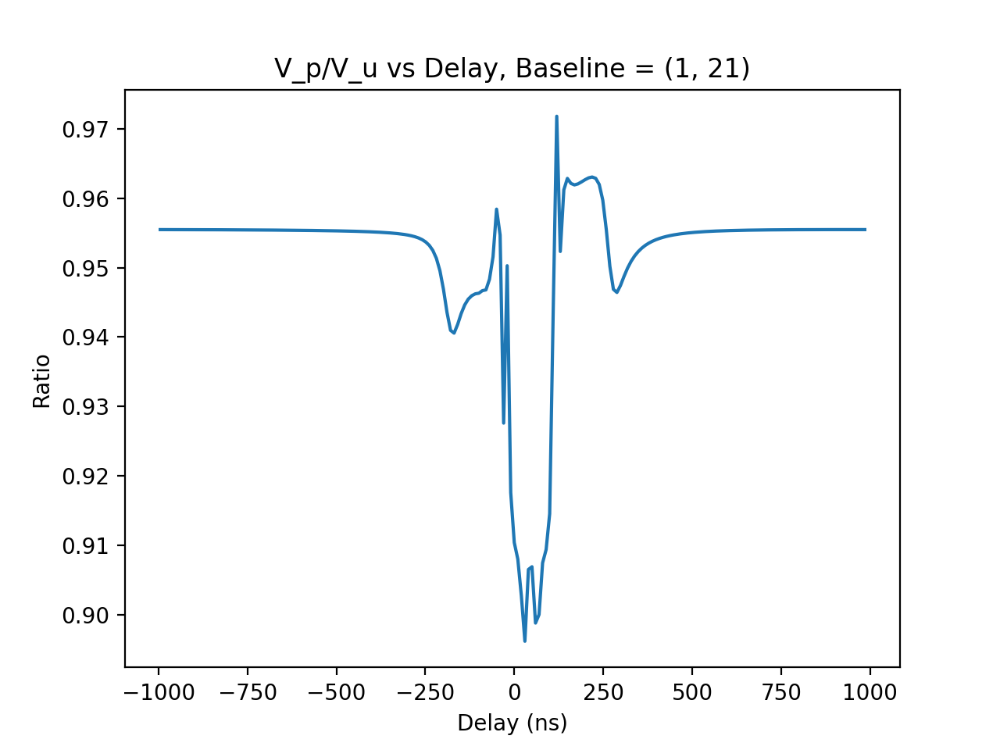

<IPython.core.display.Javascript object>


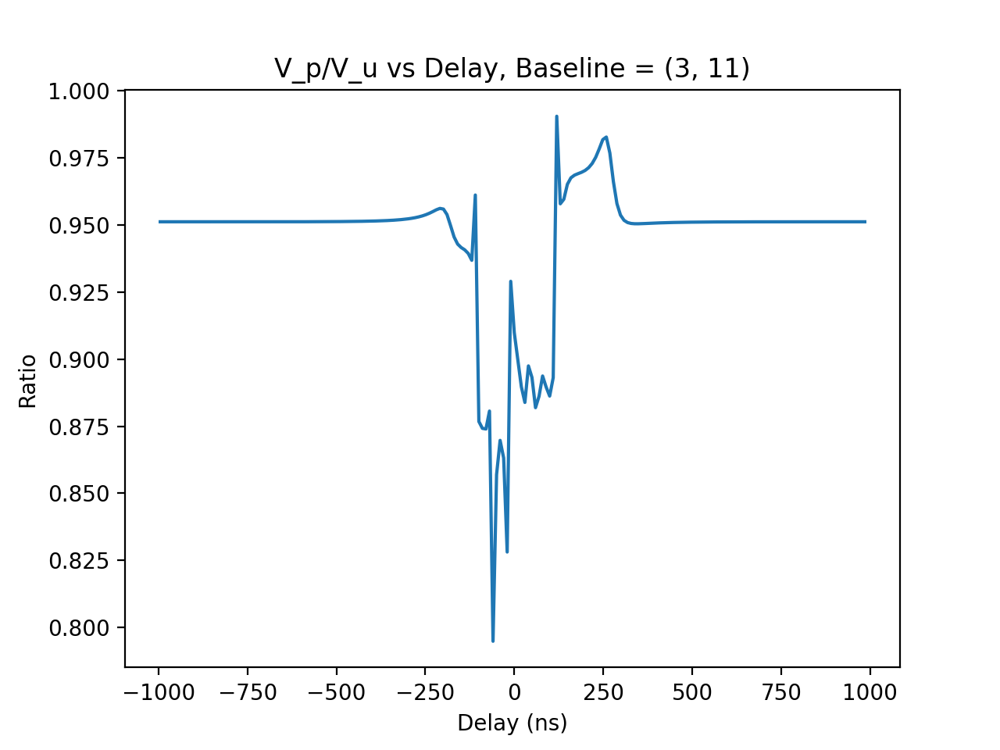

<IPython.core.display.Javascript object>


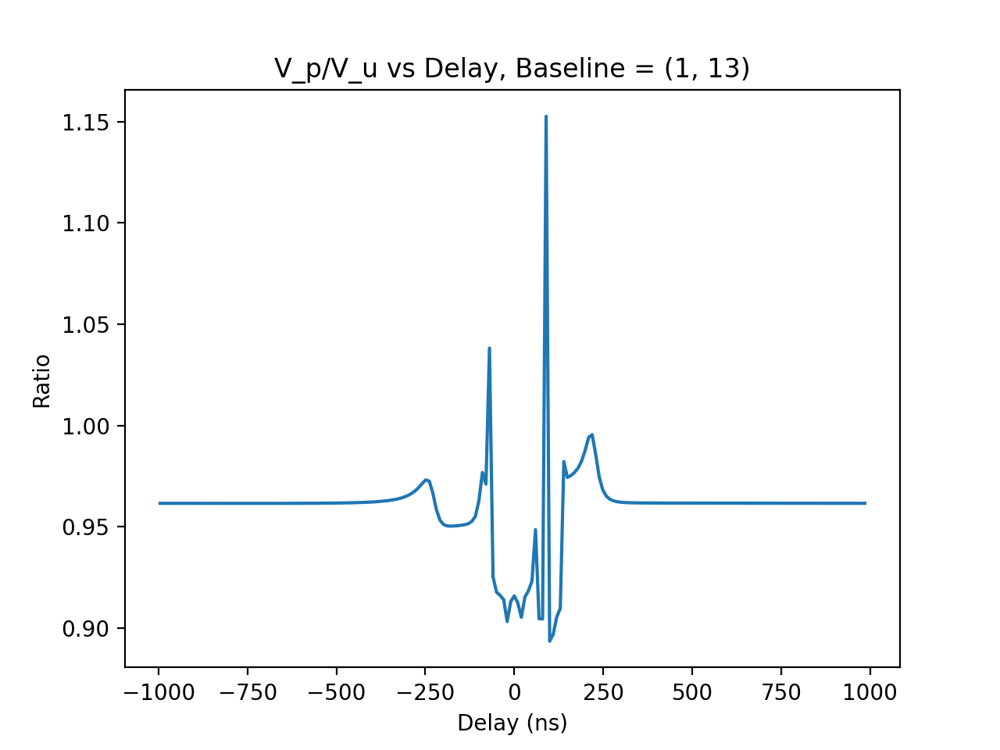

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<IPython.core.display.Javascript object>


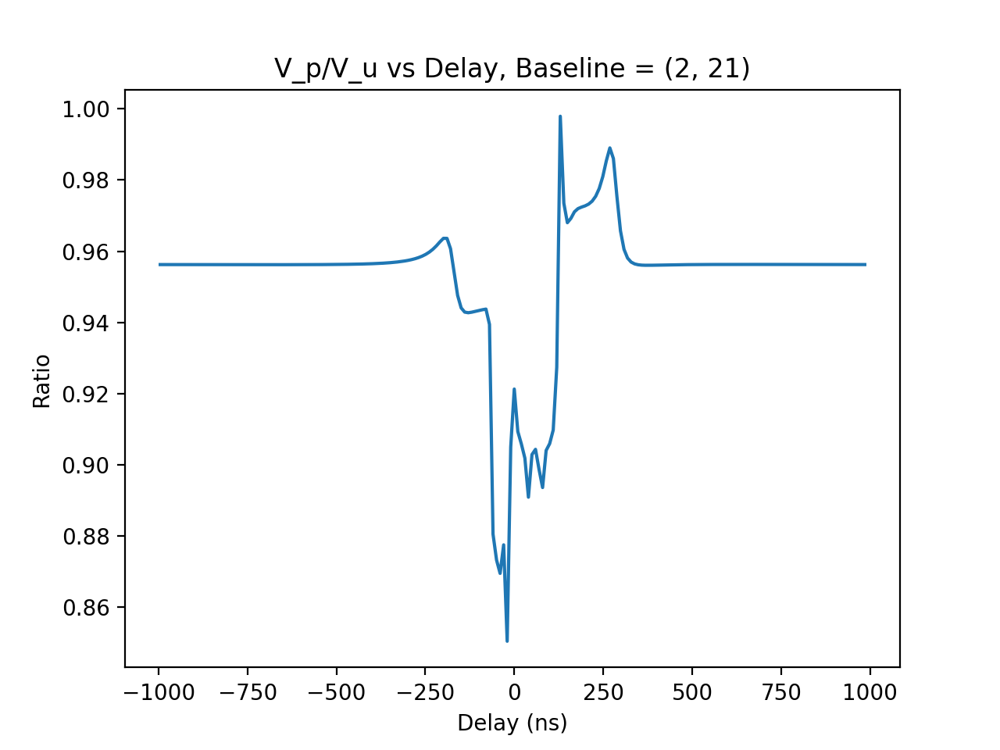

<IPython.core.display.Javascript object>


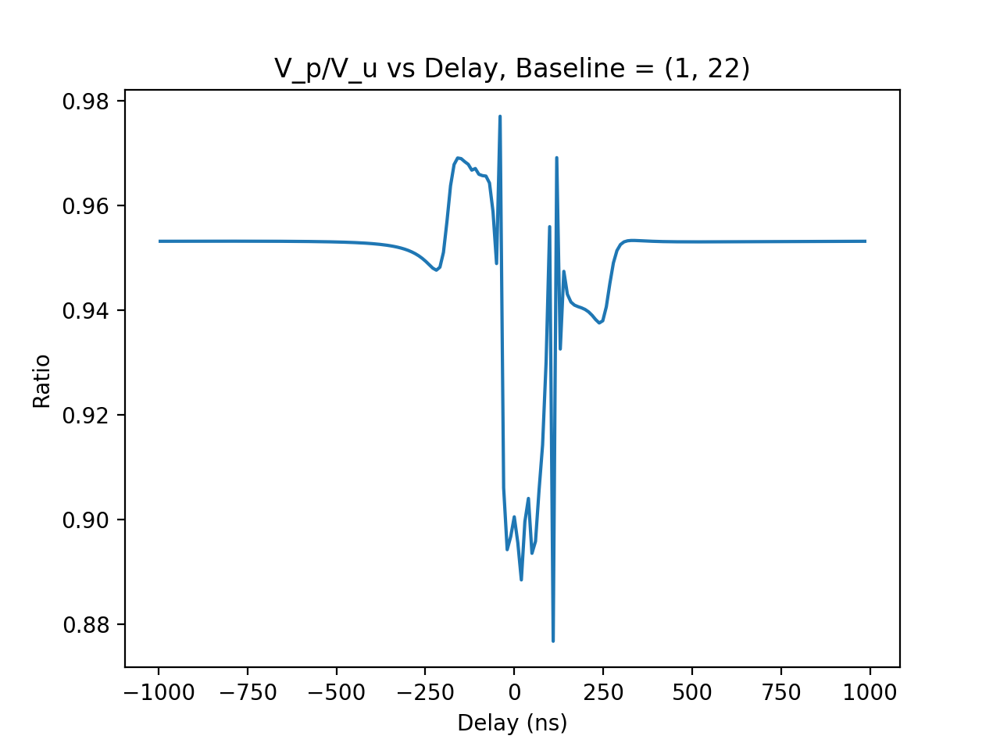

In [45]:
for key in unpert_vis:
    plt.figure()
    plt.title('V_p/V_u vs Delay, Baseline = ' + str(key))
    plt.xlabel('Delay (ns)')
    plt.ylabel('Ratio')
    ratio = fft_vis_dict(pert_vis,key,window) / fft_vis_dict(unpert_vis,key,window)
    plt.plot(delays,ratio)
plt.show()

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<IPython.core.display.Javascript object>


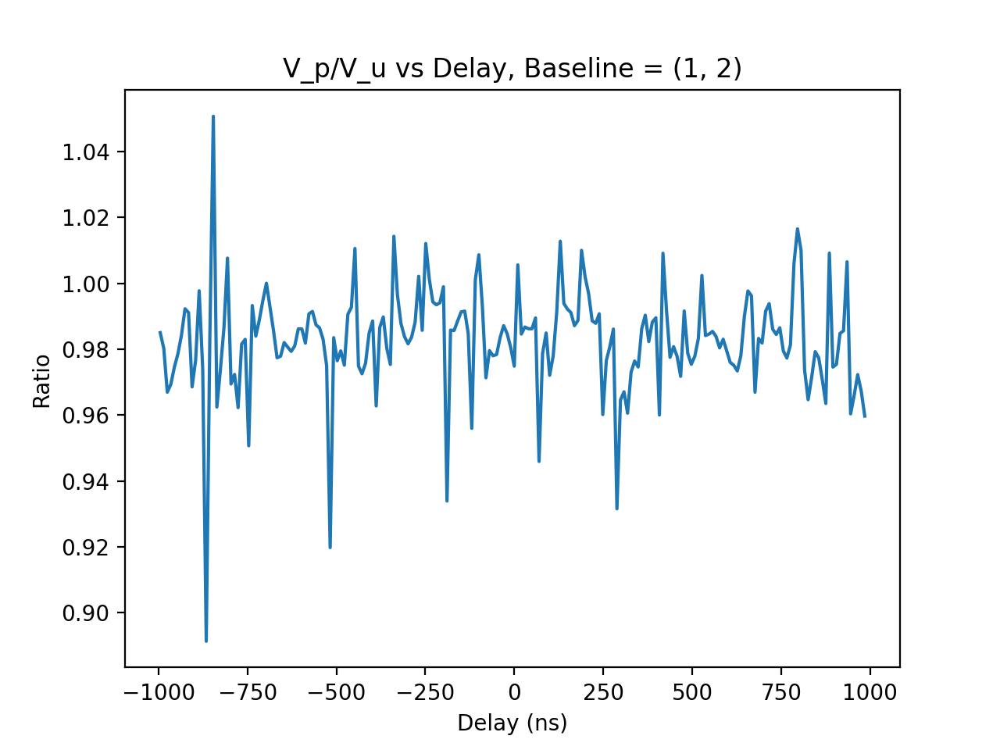

<IPython.core.display.Javascript object>


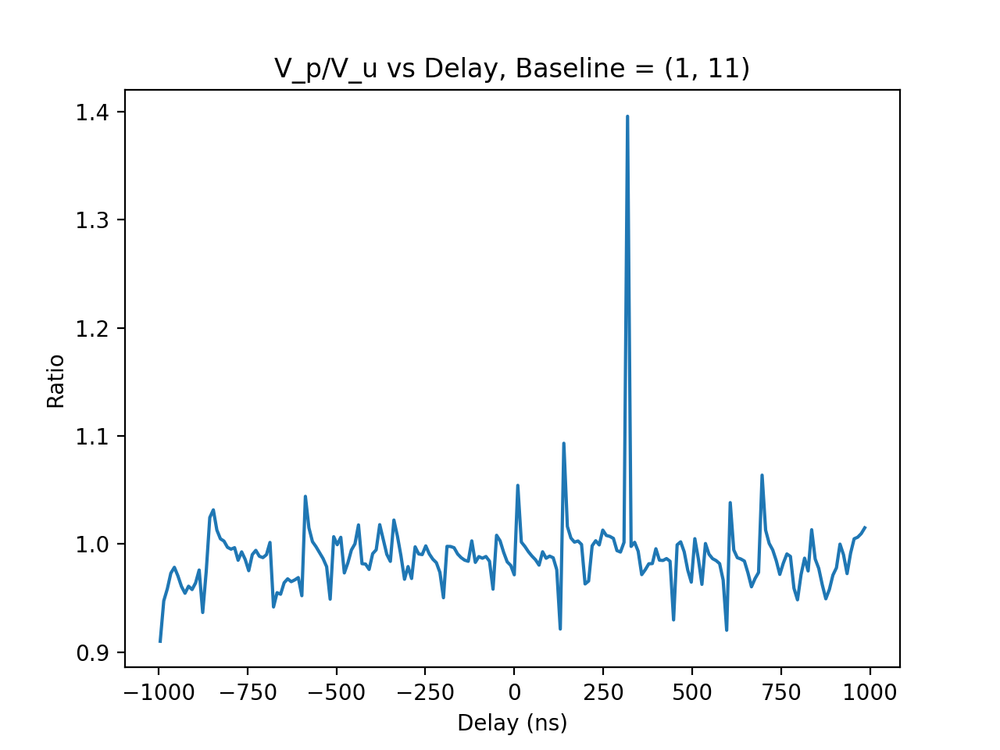

<IPython.core.display.Javascript object>


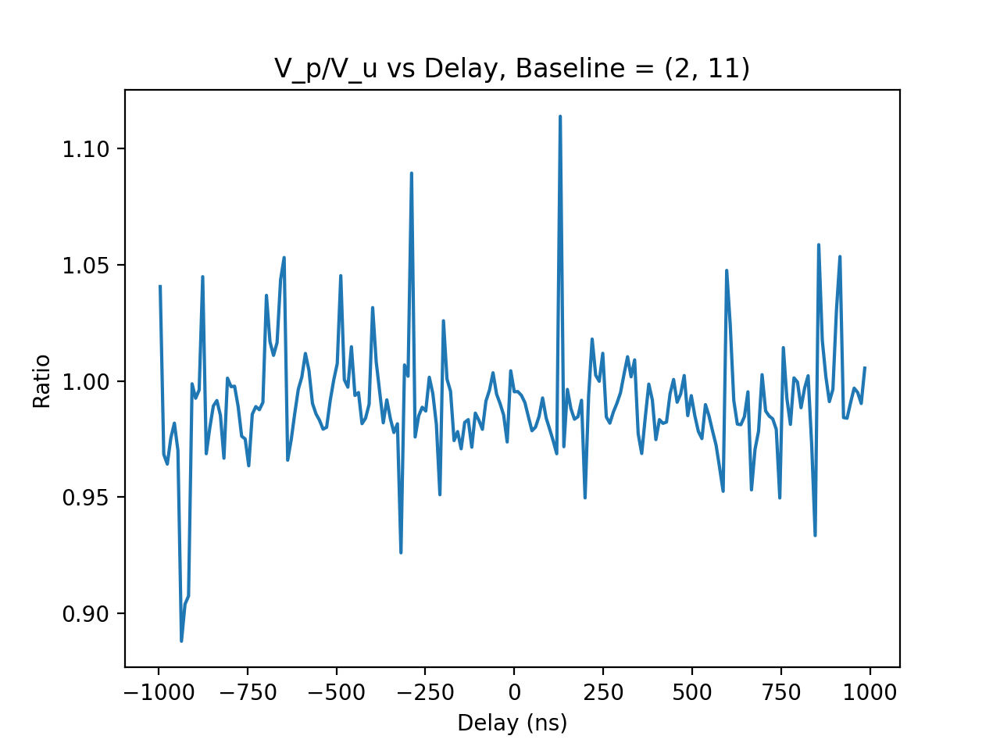

<IPython.core.display.Javascript object>


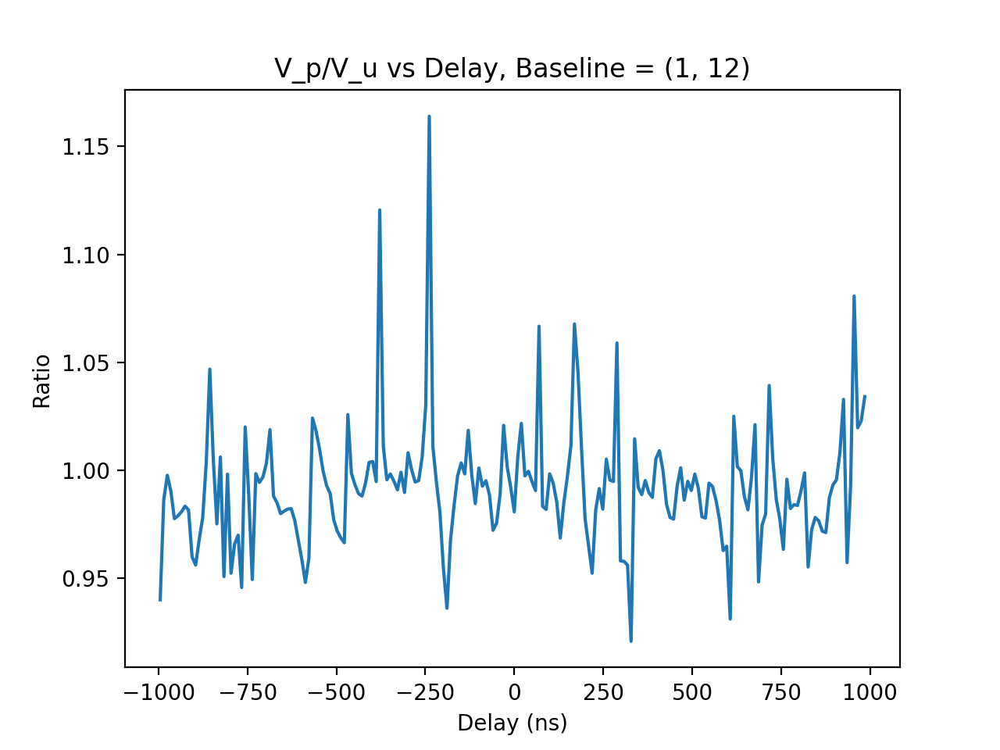

<IPython.core.display.Javascript object>


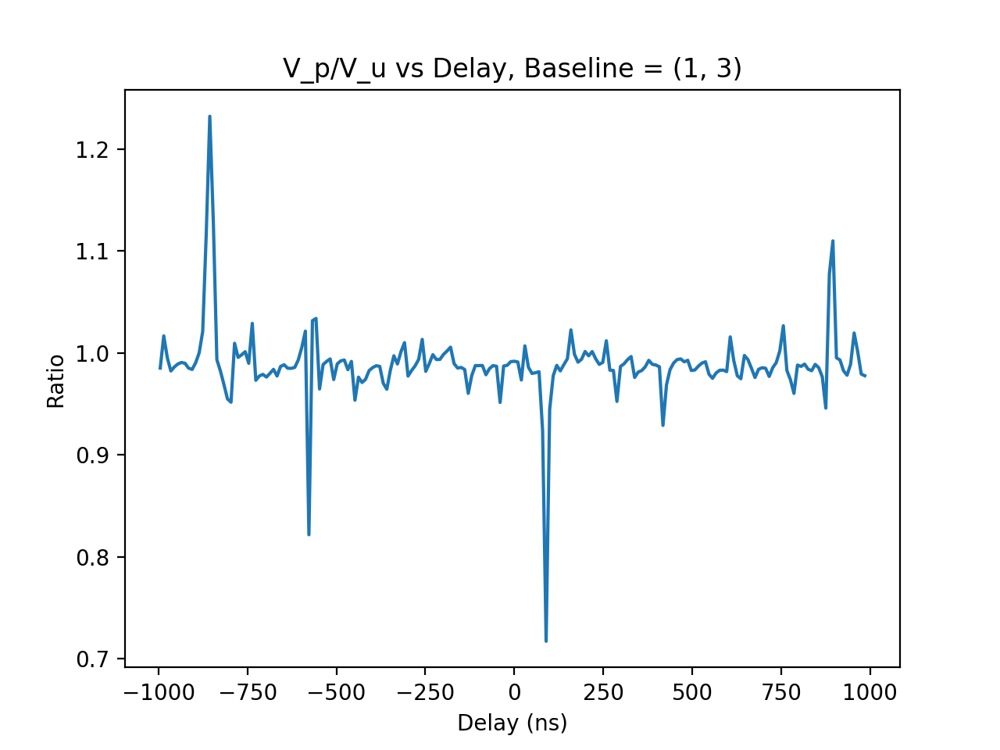

<IPython.core.display.Javascript object>


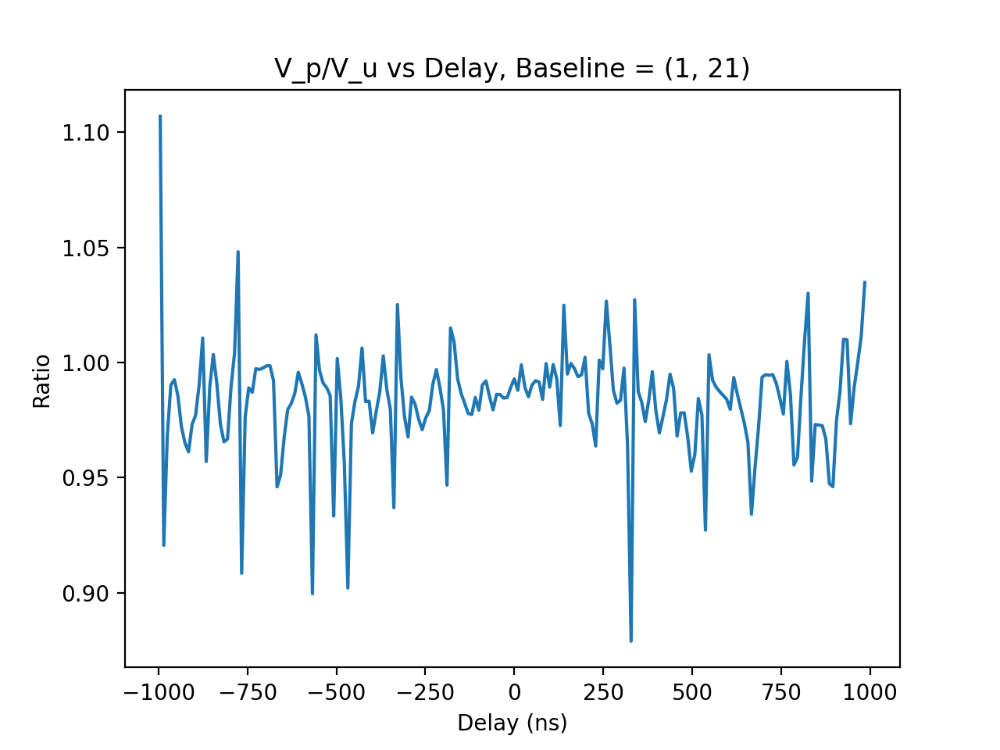

<IPython.core.display.Javascript object>


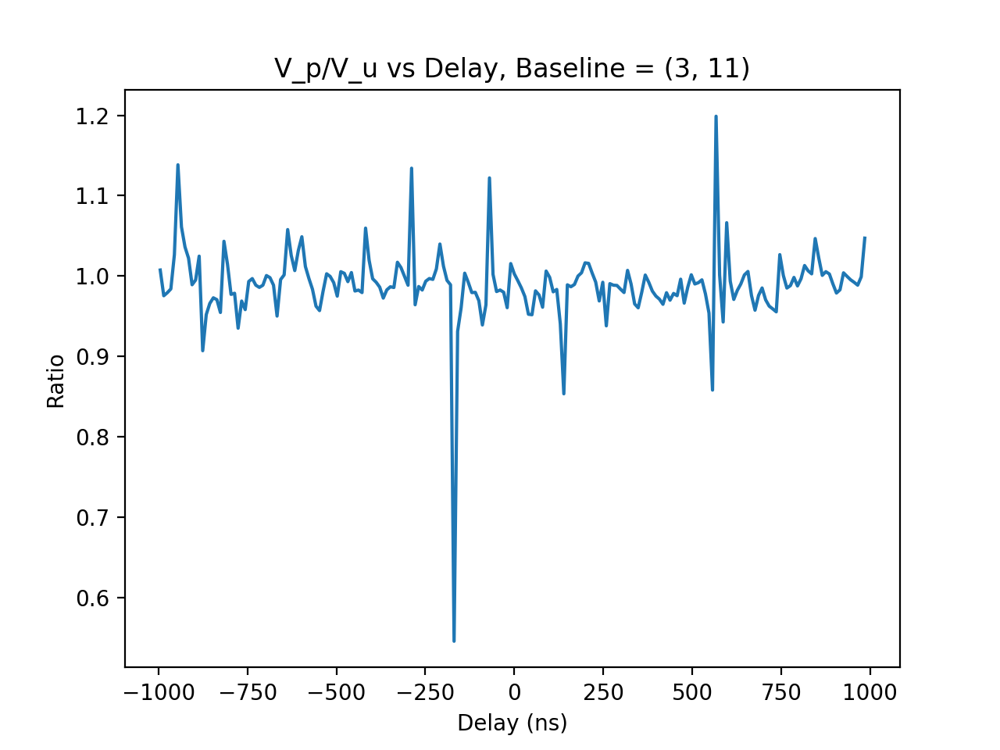

<IPython.core.display.Javascript object>


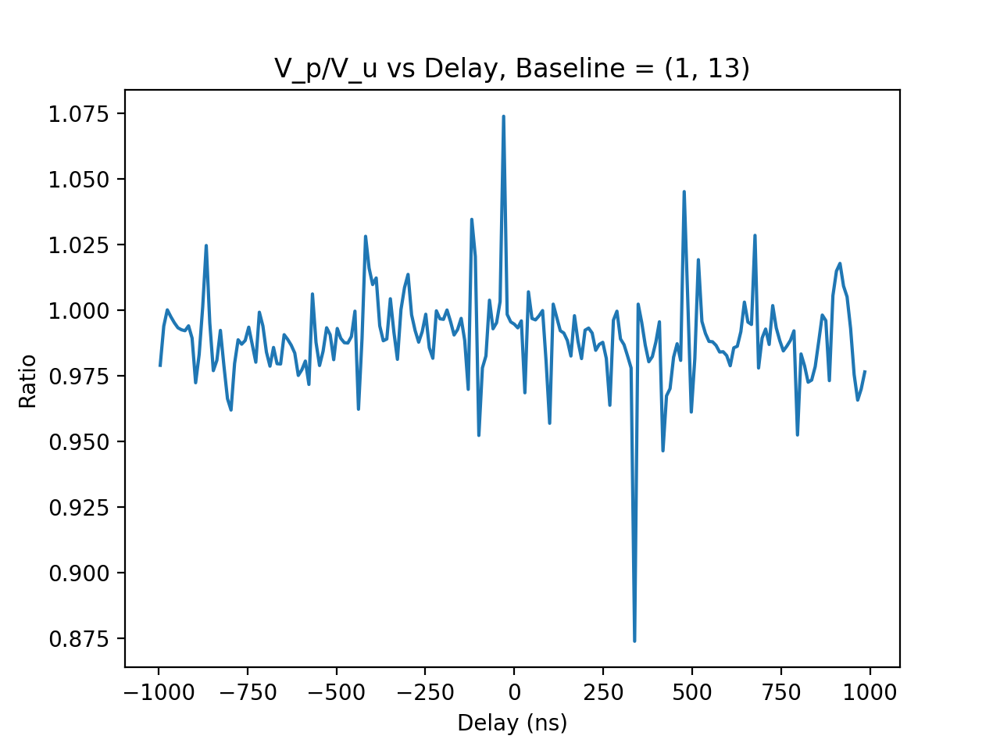

<IPython.core.display.Javascript object>


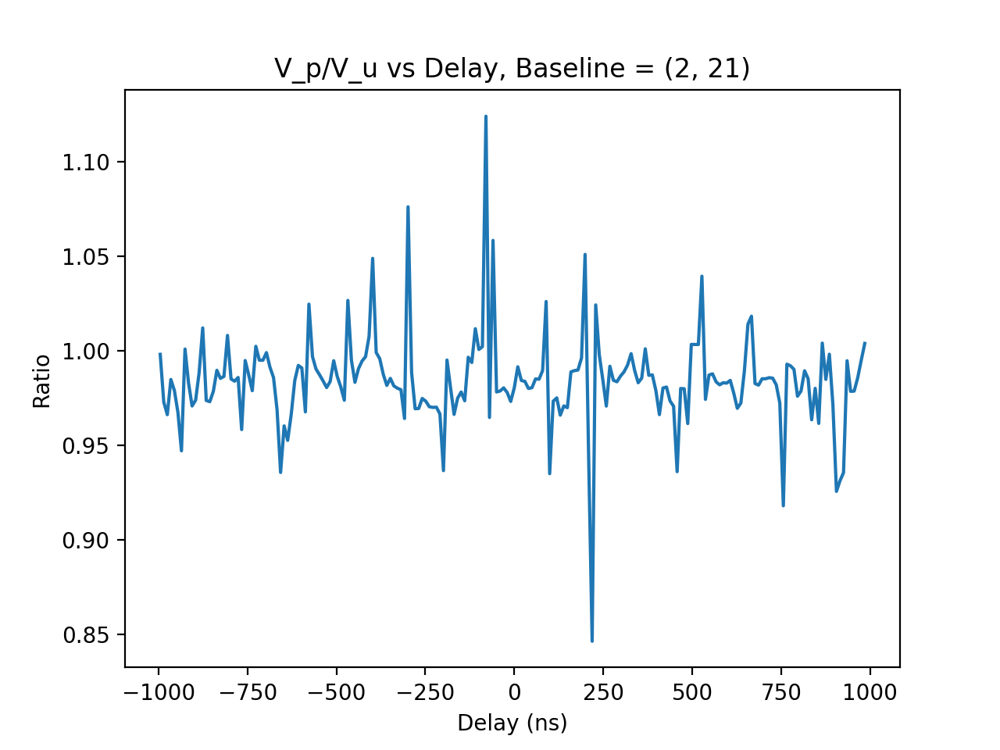

<IPython.core.display.Javascript object>


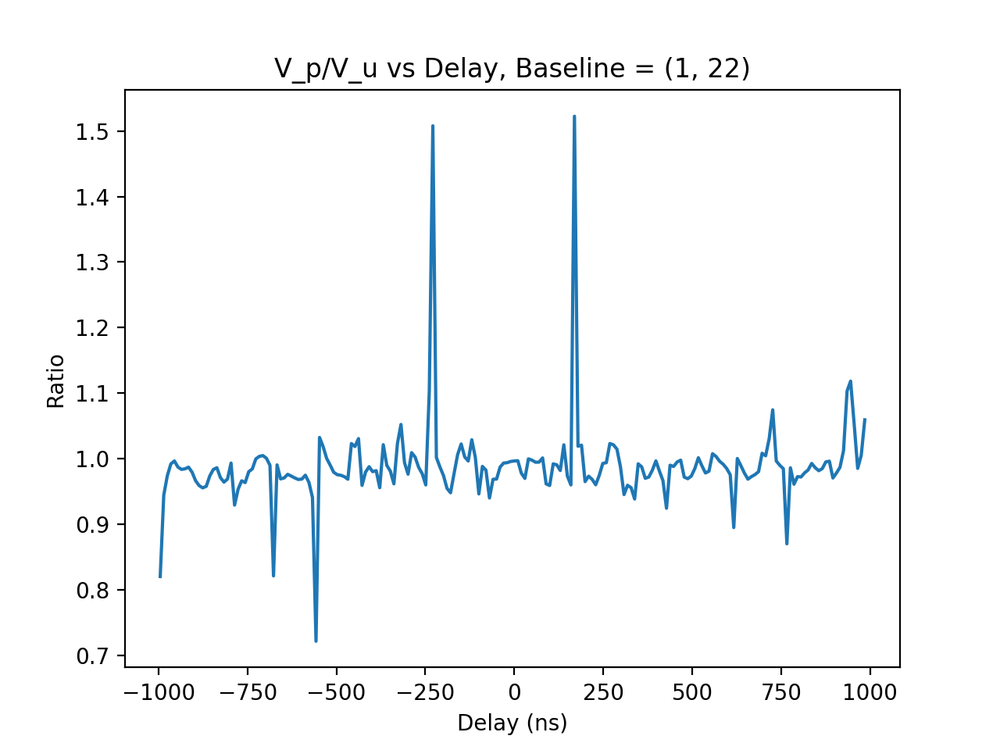

In [46]:
for key in unpert_vis:
    plt.figure()
    plt.title('V_p/V_u vs Delay, Baseline = ' + str(key))
    plt.xlabel('Delay (ns)')
    plt.ylabel('Ratio')
    ratio = fft_vis_dict(pert_noise,key,window) / fft_vis_dict(unpert_noise,key,window)
    plt.plot(delays,ratio)
plt.show()

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<IPython.core.display.Javascript object>


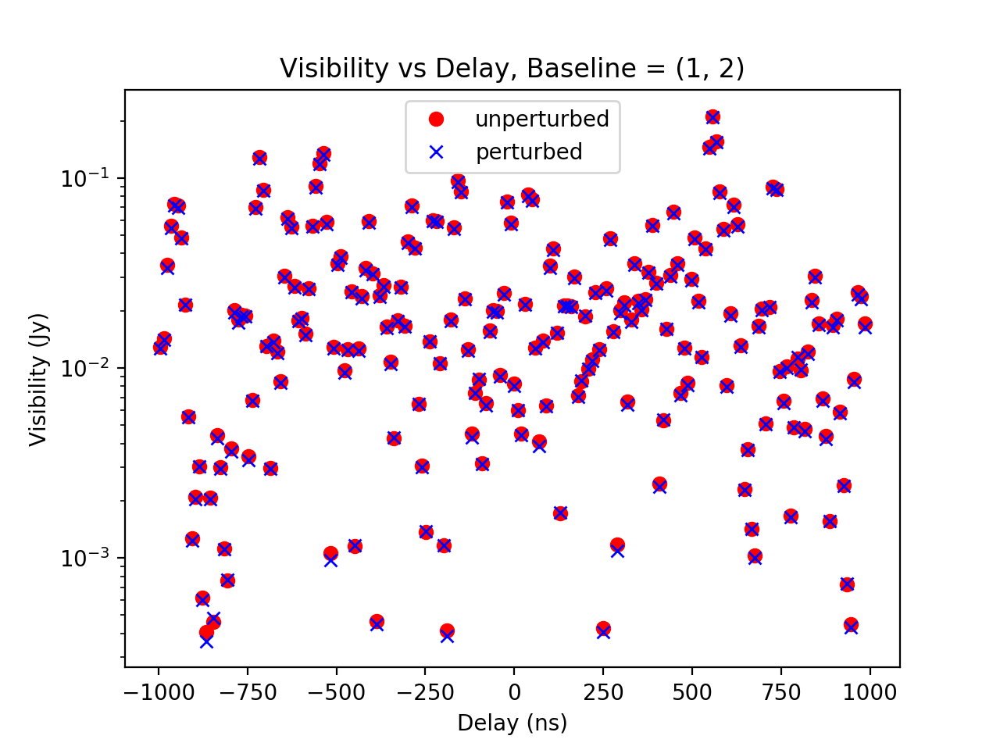

<IPython.core.display.Javascript object>


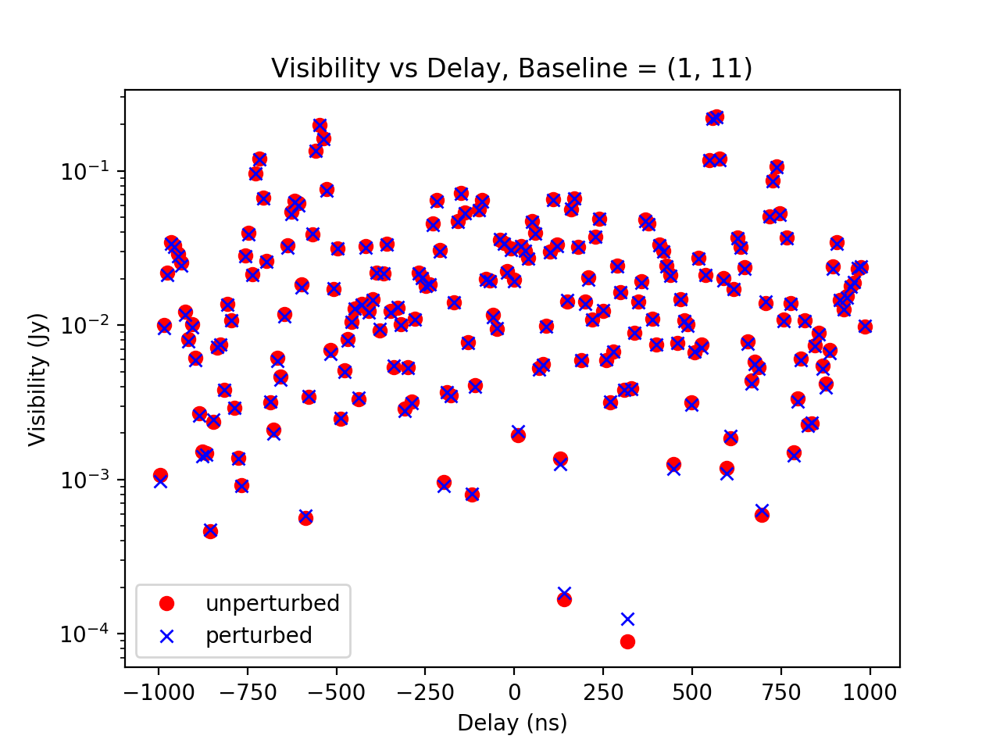

<IPython.core.display.Javascript object>


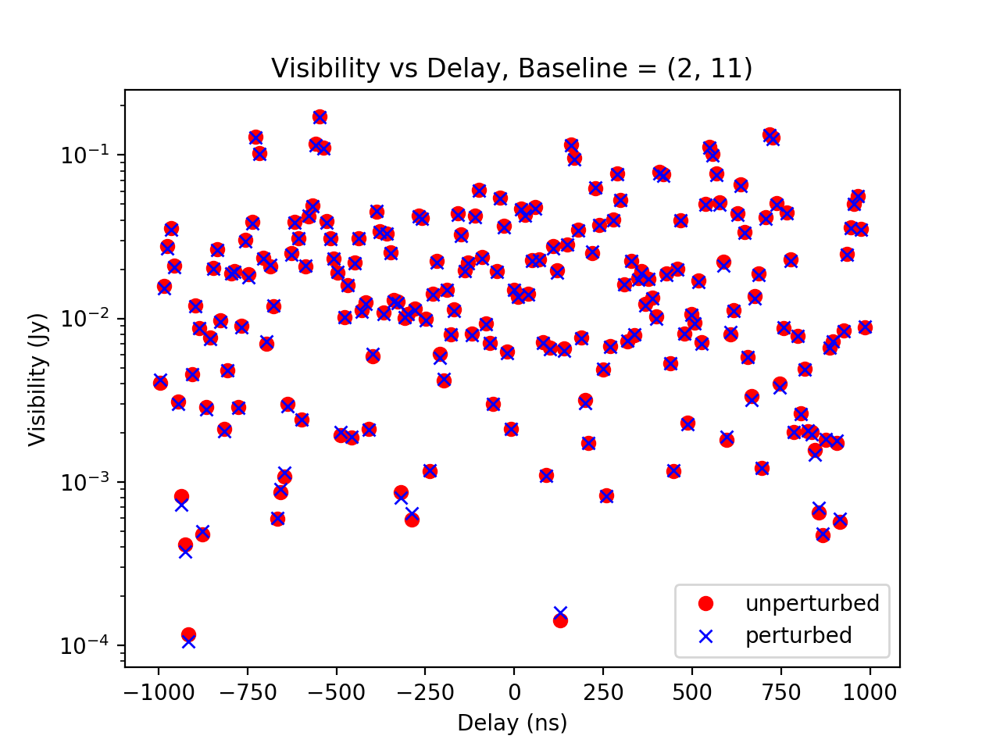

<IPython.core.display.Javascript object>


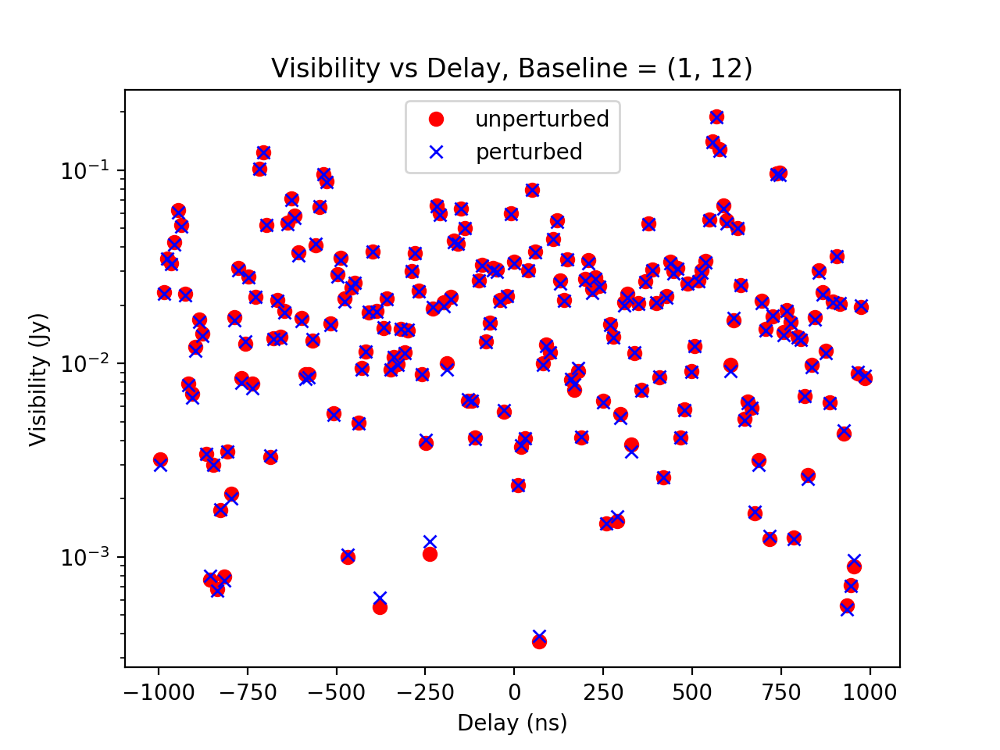

<IPython.core.display.Javascript object>


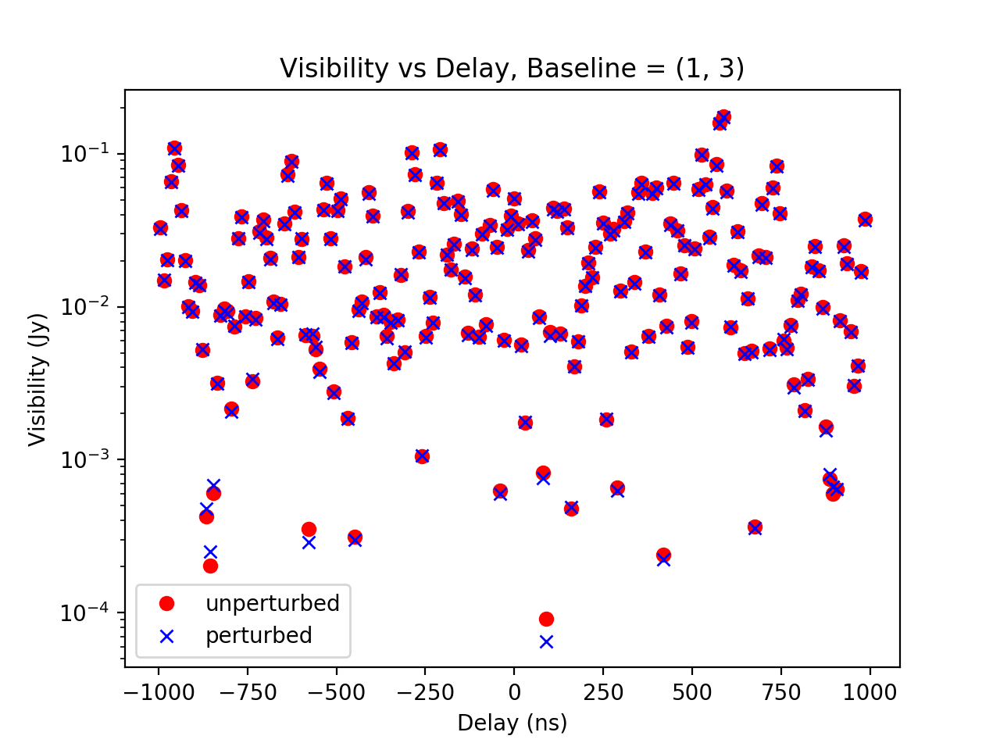

<IPython.core.display.Javascript object>


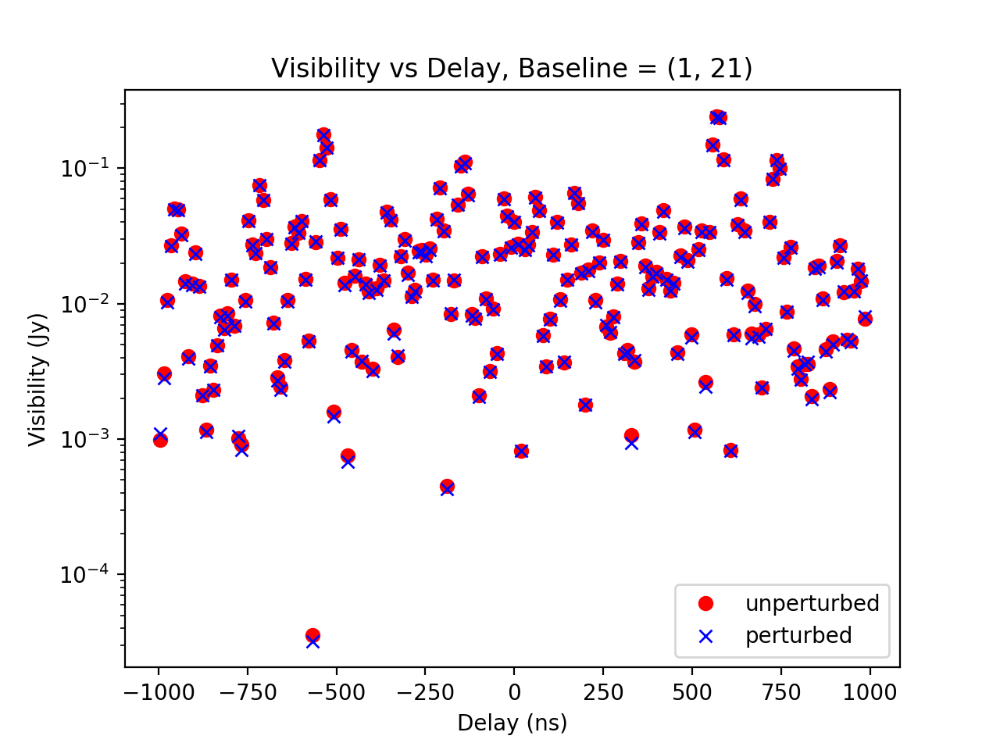

<IPython.core.display.Javascript object>


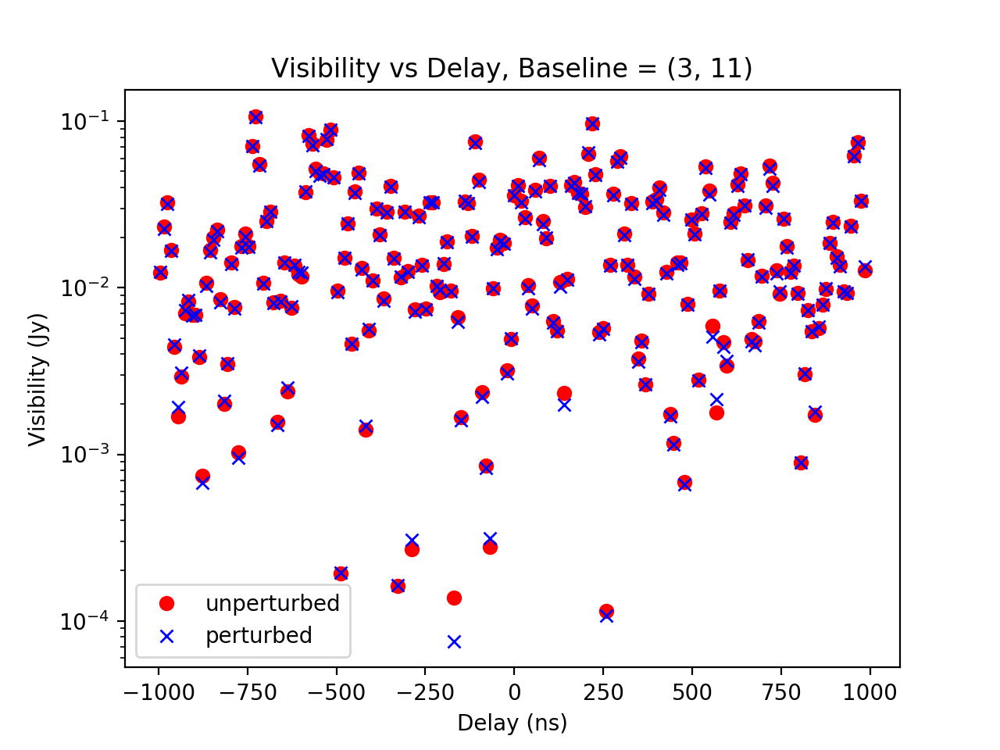

<IPython.core.display.Javascript object>


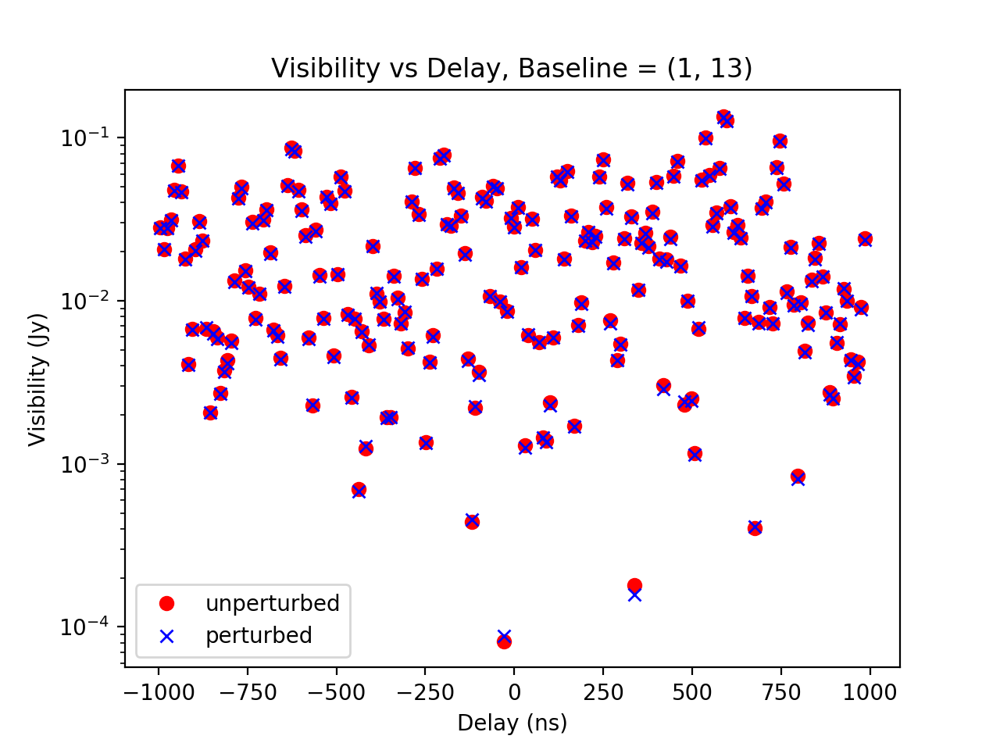

<IPython.core.display.Javascript object>


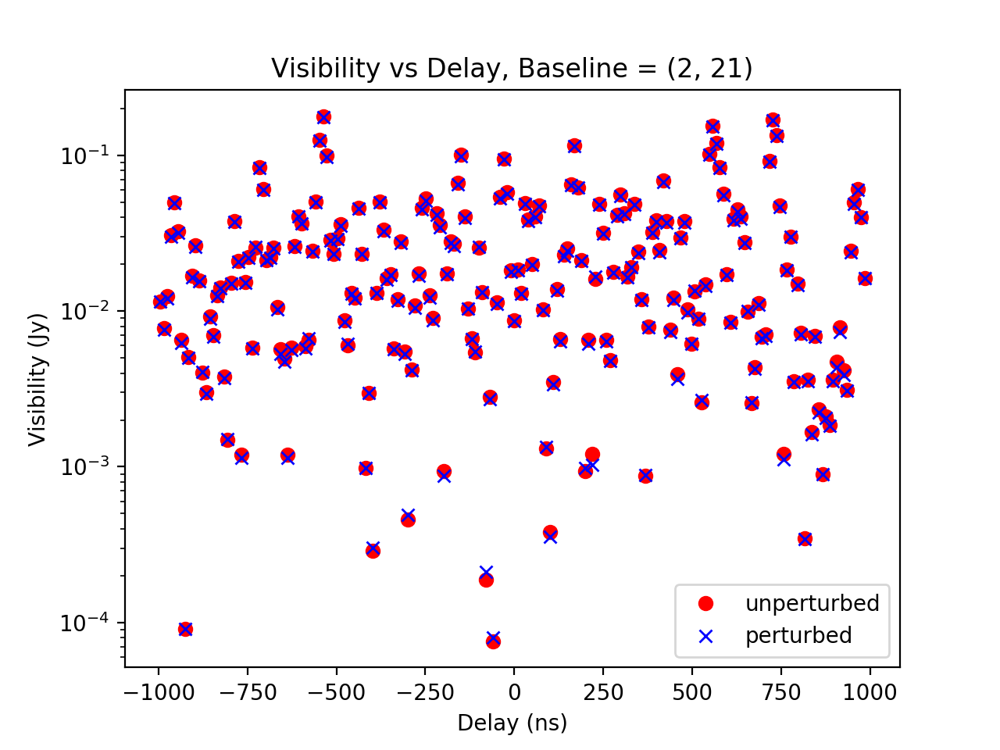

<IPython.core.display.Javascript object>


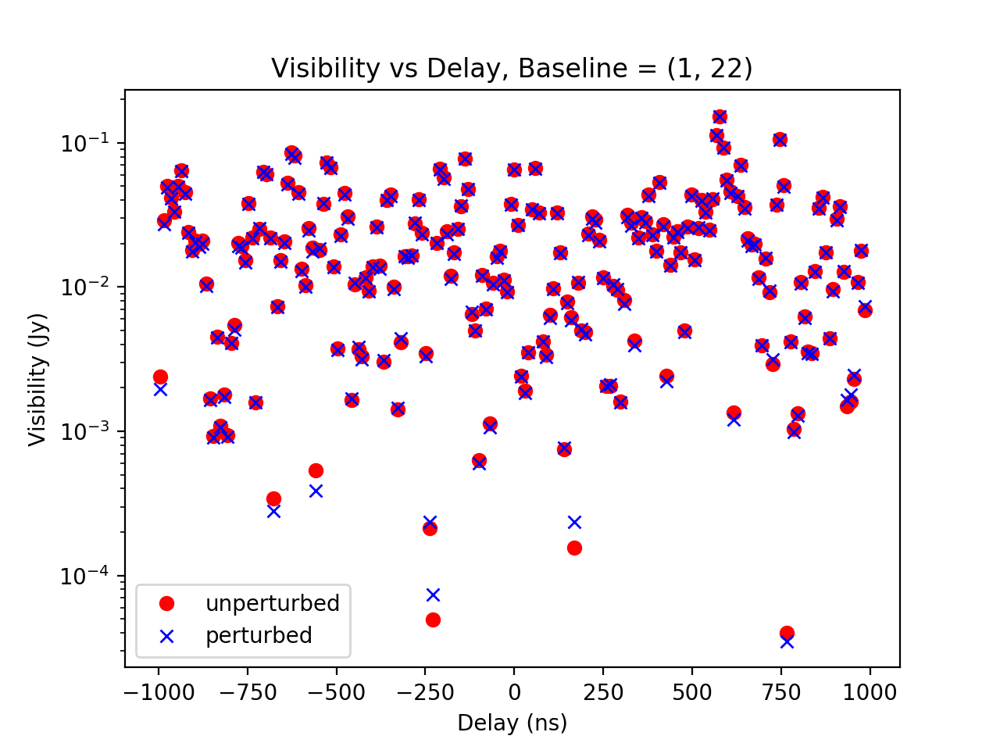

In [47]:
for key in unpert_vis:
    plt.figure()
    plt.title('Visibility vs Delay, Baseline = ' + str(key))
    plt.xlabel('Delay (ns)')
    plt.ylabel('Visibility (Jy)')
    # notice the tapering effect as a result of doing this
    plt.semilogy(delays,fft_vis_dict(unpert_noise,key,window),'ro',label='unperturbed')
    plt.semilogy(delays,fft_vis_dict(pert_noise,key,window),'bx',label='perturbed')
    plt.legend()
    # be sure to use the same windows for both pert and unpert
plt.show()